### Datasets and DataLoaders

In [172]:
# Instalacion de las librerias necesarias
%pip install transformers
%pip install torch torchvision torchaudio
%pip install opencv-python
%pip install numpy
%pip install albumentations
%pip install pillow
%pip install matplotlib
%pip install pandas

%pip install seaborn
%pip install tqdm

%pip install segmentation_models_pytorch

#%pip install sklearn
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [173]:
# impotacion de librerias
import json, os, torch, cv2, numpy as np, albumentations as A
from PIL import Image; from matplotlib import pyplot as plt
from glob import glob; from PIL import ImageFile
from torch.utils.data import random_split, Dataset, DataLoader
from albumentations.pytorch import ToTensorV2
import random

import sklearn.metrics as metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, roc_auc_score, mean_squared_error, r2_score


import os
import numpy as np

import pandas as pd

import albumentations as A
from albumentations.pytorch import ToTensorV2

ImageFile.LOAD_TRUNCATED_IMAGES = True


import segmentation_models_pytorch as smp, time
from tqdm import tqdm
from torch.nn import functional as F


import cv2
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
from typing import List, Tuple, Optional
import matplotlib.patches as mpatches

import random
import matplotlib.pyplot as plt
import math 
from torchvision import transforms as tfs

import torch
import torch.nn as nn
import time



In [174]:
# Exploracion del archivo CSV con los labels

path_csv = "C:\\Users\\pc\\Desktop\\Proyecto_Segmentacion\\dataset\\labels.csv"   # ajusta a tu ruta real

df = pd.read_csv(path_csv)


# #limpieza de los nombres de las columnas
# df.columns = df.columns.str.strip().str.replace('\ufeff', '')

# print(df.head())
# print(df.tail())
# print(df.shape)

# col = "label_list"   # nombre correcto



In [175]:
# Copia de seguridad
df2 = df.copy()

df2 = pd.read_csv(path_csv)

#limpieza de los nombres de las columnas
df2.columns = df2.columns.str.strip().str.replace('\ufeff', '')

print(df2.head())
print(df2.tail())
print(df2.shape)

   Unnamed: 0   label_list
0           0   background
1           1  accessories
2           2          bag
3           3         belt
4           4       blazer
    Unnamed: 0 label_list
54          54        top
55          55       vest
56          56     wallet
57          57      watch
58          58     wedges
(59, 2)


In [176]:

col = "label_list"   # nombre correcto


# Mapeo SEMÁNTICO (texto → clase limpia)
mapping = {
    # --- TOPWEAR (tops + outerwear juntos) ---
    "blazer": "topwear",
    "jacket": "topwear",
    "coat": "topwear",
    "cape": "topwear",
    "cardigan": "topwear",
    "suit": "topwear",

    "t-shirt": "topwear",
    "shirt": "topwear",
    "top": "topwear",
    "sweater": "topwear",
    "hoodie": "topwear",
    "blouse": "topwear",
    "bodysuit": "topwear",
    "sweatshirt": "topwear",
    "vest": "topwear",

    # --- LOWERWEAR ---
    "pants": "lowerwear",
    "jeans": "lowerwear",
    "leggings": "lowerwear",
    "skirt": "lowerwear",
    "shorts": "lowerwear",
    "panties": "lowerwear",
    "tights": "lowerwear",

    # --- DRESSES ---
    "dress": "dress",
    "romper": "dress",

    # --- FOOTWEAR ---
    "boots": "footwear",
    "sneakers": "footwear",
    "flats": "footwear",
    "heels": "footwear",
    "loafers": "footwear",
    "sandals": "footwear",
    "wedges": "footwear",
    "pumps": "footwear",
    "clogs": "footwear",
    "shoes": "footwear",

    # --- BODY (reabierto) ---
    "hair": "body",
    "skin": "body",

    # --- BACKGROUND ---
    "background": "background"
}

# Aplicar mapeo (todo lo no definido → ignore)
df2["clean_label"] = df2["label_list"].map(mapping).fillna("ignore")

# Mapeo NUMÉRICO FINAL (coherente con clean_label)
numeric_mapping = {
    "background": 0,
    "topwear": 1,
    "lowerwear": 2,
    "dress": 3,
    "footwear": 4,
    "body": 5,
    "ignore": 255
}

df2["numeric_label"] = df2["clean_label"].map(numeric_mapping)

# Etiqueta concatenada (debug / visualización)
df2["concatenated_label"] = df2.apply(
    lambda row: f"{row['numeric_label']}: {row['clean_label']}",
    axis=1
)

# Guardar
df2.to_csv("dataset/label_list_clean_with_numeric.csv", index=False)

# Debug
print(df2[['label_list', 'clean_label', 'numeric_label', 'concatenated_label']].head(20))
print("\nDistribución de clases:")
print(df2['numeric_label'].value_counts().sort_index())


     label_list clean_label  numeric_label concatenated_label
0    background  background              0      0: background
1   accessories      ignore            255        255: ignore
2           bag      ignore            255        255: ignore
3          belt      ignore            255        255: ignore
4        blazer     topwear              1         1: topwear
5        blouse     topwear              1         1: topwear
6      bodysuit     topwear              1         1: topwear
7         boots    footwear              4        4: footwear
8           bra      ignore            255        255: ignore
9      bracelet      ignore            255        255: ignore
10         cape     topwear              1         1: topwear
11     cardigan     topwear              1         1: topwear
12        clogs    footwear              4        4: footwear
13         coat     topwear              1         1: topwear
14        dress       dress              3           3: dress
15     e

In [177]:
df2

,Unnamed: 0,label_list,clean_label,numeric_label,concatenated_label
0,0,background,background,0,0: background
1,1,accessories,ignore,255,255: ignore
2,2,bag,ignore,255,255: ignore
3,3,belt,ignore,255,255: ignore
4,4,blazer,topwear,1,1: topwear
5,5,blouse,topwear,1,1: topwear
6,6,bodysuit,topwear,1,1: topwear
7,7,boots,footwear,4,4: footwear
8,8,bra,ignore,255,255: ignore
9,9,bracelet,ignore,255,255: ignore


In [178]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59 entries, 0 to 58
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Unnamed: 0          59 non-null     int64 
 1   label_list          59 non-null     object
 2   clean_label         59 non-null     object
 3   numeric_label       59 non-null     int64 
 4   concatenated_label  59 non-null     object
dtypes: int64(2), object(3)
memory usage: 2.4+ KB


In [179]:
df2['numeric_label'].value_counts

<bound method IndexOpsMixin.value_counts of 0       0
1     255
2     255
3     255
4       1
5       1
6       1
7       4
8     255
9     255
10      1
11      1
12      4
13      1
14      3
15    255
16      4
17    255
18    255
19      5
20    255
21      4
22      1
23    255
24      1
25      2
26    255
27      2
28      4
29    255
30      2
31      2
32      4
33    255
34    255
35      3
36      4
37    255
38      1
39      4
40      2
41      5
42      2
43      4
44    255
45    255
46      1
47    255
48      1
49      1
50    255
51      1
52    255
53      2
54      1
55      1
56    255
57    255
58      4
Name: numeric_label, dtype: int64>

In [180]:

train_tf = A.Compose([
    # --- Resize y Random Crop (evita que modelo aprenda tamaño fijo) ---
    # A.Resize(320, 320),
    # A.RandomCrop(256, 256, p=0.8),
    
    A.RandomResizedCrop(
        size=(256, 256),
        scale=(0.7, 1.0),
        ratio=(0.75, 1.33),
        p=1.0
    ),

    # --- Transformaciones geométricas más robustas ---
    A.OneOf([
        A.ShiftScaleRotate(
            shift_limit=0.1, 
            scale_limit=0.2, 
            rotate_limit=15,
            border_mode=cv2.BORDER_CONSTANT,
            value=0,
            mask_value=255,
            p=1.0
        ),
        
        A.GridDistortion(
            num_steps=5, 
            distort_limit=0.3,
            border_mode=cv2.BORDER_CONSTANT,
            value=0,
            mask_value=255,
            p=0.3
        ),
    ], p=0.8),
    
    A.HorizontalFlip(p=0.5),
    
    # --- Color y textura más agresivos ---
    A.OneOf([
        A.RandomBrightnessContrast(
            brightness_limit=0.3, 
            contrast_limit=0.3
        ),
        A.HueSaturationValue(
            hue_shift_limit=20,
            sat_shift_limit=30,
            val_shift_limit=20
        ),
        A.RGBShift(
            r_shift_limit=20,
            g_shift_limit=20,
            b_shift_limit=20
        ),
    ], p=0.5),
    
    # --- Ruido y desenfoque ---
    A.OneOf([
        A.GaussianBlur(blur_limit=(3, 7)),
        A.MedianBlur(blur_limit=5),
        A.MotionBlur(blur_limit=7),
    ], p=0.3),
    
    A.GaussNoise(var_limit=(10.0, 40.0), p=0.2),
    
    # --- Compresión y calidad (simula diferentes fuentes) ---
    A.ImageCompression(
        quality_lower=60, 
        quality_upper=95, 
        p=0.2
    ),
    
    # --- Cutout / CoarseDropout (regularización espacial) ---
    A.CoarseDropout(
        max_holes=8, 
        max_height=32, 
        max_width=32,
        min_holes=1,
        min_height=8,
        min_width=8,
        fill_value=0,
        mask_fill_value=255,
        p=0.3
    ),
    
    # --- Normalización ---
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
    
    ToTensorV2()
])

val_tf = A.Compose([
    A.Resize(256, 256),
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
    ToTensorV2()
])


c:\Users\pc\Desktop\Proyecto_Segmentacion\.venv\Lib\site-packages\albumentations\core\validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
C:\Users\pc\AppData\Local\Temp\ipykernel_12992\3931023381.py:15: UserWarning: Argument(s) 'value, mask_value' are not valid for transform ShiftScaleRotate
  A.ShiftScaleRotate(
C:\Users\pc\AppData\Local\Temp\ipykernel_12992\3931023381.py:25: UserWarning: Argument(s) 'value, mask_value' are not valid for transform GridDistortion
  A.GridDistortion(
C:\Users\pc\AppData\Local\Temp\ipykernel_12992\3931023381.py:62: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 40.0), p=0.2),
C:\Users\pc\AppData\Local\Temp\ipykernel_12992\3931023381.py:65: UserWarning: Argument(s) 'quality_lower, quality_upper' are not valid for transform ImageCompression
  A.ImageCompression(
C:\Users\pc\AppData\L

In [181]:
root = "C:\\Users\\pc\\Desktop\\Proyecto_Segmentacion\\dataset"
csv_labels_path = "C:\\Users\\pc\\Desktop\\Proyecto_Segmentacion\\dataset\\label_list_clean_with_numeric.csv"


In [182]:
class CustomSegmentationDataset(Dataset):

    def __init__(self, root, transformations=None, csv_labels_path=None):

        # Paths
        self.im_paths = sorted(glob(os.path.join(root, "png_images", "IMAGES", "*.png")))
        self.gt_paths = sorted(glob(os.path.join(root, "png_masks", "MASKS", "*.png")))

        assert len(self.im_paths) == len(self.gt_paths), \
            "Cantidad de imágenes y máscaras no coincide."

        self.transformations = transformations
        self.ignore_index = 255

        # ============================
        # 1. CSV limpio
        # ============================
        
        
        self.id_to_numeric = dict(zip(df2["Unnamed: 0"], df2["numeric_label"]))


        # id original → label limpio
        self.id_to_clean = dict(zip(df2["Unnamed: 0"], df2["clean_label"]))
        
        # Obtener clases válidas (excluyendo ignore)
        valid_classes_df2 = df2[df2["numeric_label"] != self.ignore_index].copy()
        
        # Info del dataset
        self.n_cls = len(
            sorted(df2[df2["numeric_label"] != self.ignore_index]["numeric_label"].unique())
        )
        
        # Usar con sus ids de su base
        self.label_to_idx = dict(zip(valid_classes_df2["clean_label"], valid_classes_df2["numeric_label"])
)
       
        
        # Mapeo inverso para decodificar predicciones
        self.idx_to_label = {idx: cls for cls, idx in self.label_to_idx.items()}
        
        self.n_cls = len(self.label_to_idx)
        
    
        
            
    
    def __len__(self):
        return len(self.im_paths)

    def __getitem__(self, idx):

        im = np.array(Image.open(self.im_paths[idx]).convert("RGB"))
        gt = np.array(Image.open(self.gt_paths[idx]))

        # ============================
        # 2. Remapeo con ignore_index
        # ============================
        remapped = np.full_like(gt, fill_value=self.ignore_index, dtype=np.int64)

        # Aplicar el mapeo directamente
        for original_id, numeric_label in self.id_to_numeric.items():
            remapped[gt == original_id] = numeric_label

        gt = remapped
        
        # Asegurar que gt sea int64
        gt = gt.astype(np.int64)

        # Transformaciones
        if self.transformations:
            augmented = self.transformations(image=im, mask=gt)
            im, gt = augmented["image"], augmented["mask"]
            
        # Asegurar tipo después de transformaciones
        if torch.is_tensor(gt):
            gt = gt.long()  # Convertir a Long
        elif isinstance(gt, np.ndarray):
            gt = gt.astype(np.int64)
            
        # Asegurar que las imágenes estén en float32
        if torch.is_tensor(im):
            im = im.float()
            

        return im, gt
    
    def get_class_names(self):
            """Retorna los nombres de las clases en orden"""
            return [self.idx_to_label[i] for i in range(self.n_cls)]
        
    
    

In [183]:
def get_dls(
    root,
    train_tf,
    val_tf,
    bs,
    split=(0.8, 0.1, 0.1),
    ns=2,
    csv_labels_path=None,
    seed=42,
    device="cpu"
):
    # Dataset base (solo info)
    base_ds = CustomSegmentationDataset(
        root=root,
        transformations=None,
        csv_labels_path=csv_labels_path
    )
    

    dataset_info = {
        'n_cls': base_ds.n_cls,
        'ignore_index': base_ds.ignore_index,
        'class_names': base_ds.get_class_names(),
        'label_to_idx': base_ds.label_to_idx,
        'idx_to_label': base_ds.idx_to_label
    }   

    
    print(dataset_info)

    # reproducibilidad
    generator = torch.Generator().manual_seed(seed)

    tr_len = int(len(base_ds) * split[0])
    val_len = int(len(base_ds) * split[1])
    test_len = len(base_ds) - tr_len - val_len

    # tr_ds, val_ds, test_ds = torch.utils.data.random_split(
    #     base_ds, [tr_len, val_len, test_len], generator=generator
    # )
    
    indices = torch.randperm(len(base_ds), generator=generator)

    tr_idx = indices[:tr_len]
    val_idx = indices[tr_len:tr_len + val_len]
    test_idx = indices[tr_len + val_len:]


    
    print(f"\nDIVISIÓN DEL DATASET (seed={seed}):")
    print(f"Train: {len(tr_idx)} muestras ({split[0]*100:.1f}%)")
    print(f"Val:   {len(val_idx)} muestras ({split[1]*100:.1f}%)")
    print(f"Test:  {len(test_idx)} muestras ({split[2]*100:.1f}%)")
    
    
    # =====================================================
    # 3. Crear datasets SEPARADOS con transforms correctos
    # =====================================================
    # Datasets con transforms correctos
    train_ds = torch.utils.data.Subset(
        CustomSegmentationDataset(root, train_tf, csv_labels_path),
        tr_idx
    )

    val_ds = torch.utils.data.Subset(
        CustomSegmentationDataset(root, val_tf, csv_labels_path),
        val_idx
    )

    test_ds = torch.utils.data.Subset(
        CustomSegmentationDataset(root, val_tf, csv_labels_path),
        test_idx
    )
    
    # =====================================================
    # 4. Dataloaders
    # =====================================================
    pin = (device == "cuda")

    tr_dl = DataLoader(train_ds, bs, shuffle=True,
                       num_workers=ns, pin_memory=pin,
                       persistent_workers=(ns > 0))

    val_dl = DataLoader(val_ds, bs, shuffle=False,
                        num_workers=ns, pin_memory=pin,
                        persistent_workers=(ns > 0))

    test_dl = DataLoader(test_ds, 1, shuffle=False,
                         num_workers=ns, pin_memory=pin,
                         persistent_workers=(ns > 0))

    # VERIFICAR DISTRIBUCIÓN DE CLASES EN SPLITS
    # ============================================
    def get_class_distribution(subset):
        """Calcula distribución de clases en un subset"""
        all_masks = []
        for i in range(min(100, len(subset))):  # Muestrear hasta 100
            _, mask = subset[i]
            if torch.is_tensor(mask):
                mask = mask.numpy()
            all_masks.append(mask.flatten())
        
        if all_masks:
            concatenated = np.concatenate(all_masks)
            unique, counts = np.unique(concatenated, return_counts=True)
            dist = dict(zip(unique, counts))
            
            # Convertir índices a nombres de clase
            dist_named = {}
            for idx, count in dist.items():
                if idx == base_ds.ignore_index:
                    dist_named['ignore'] = count
                elif idx in base_ds.idx_to_label:
                    dist_named[base_ds.idx_to_label[idx]] = count
                else:
                    dist_named[str(idx)] = count
            
            return dist_named
        return {}
    
    print("\nDistribución aproximada de clases (primeras 100 muestras):")
    print("Train:", get_class_distribution(train_ds))
    print("Val:  ", get_class_distribution(val_ds))
    print("Test: ", get_class_distribution(test_ds))


        
    print("\n" + "=" * 50)
    print("DATALOADERS CREADOS EXITOSAMENTE")
    print("=" * 50)
    

    return tr_dl, val_dl, test_dl, dataset_info




In [184]:
device = "cuda" if torch.cuda.is_available() else "cpu"

tr_dl, val_dl, test_dl, info = get_dls(
    root=root,
    train_tf=train_tf,
    val_tf=val_tf,
    bs=4,
    ns=0,
    csv_labels_path=csv_labels_path,
    device=device
)



{'n_cls': 6, 'ignore_index': 255, 'class_names': ['background', 'topwear', 'lowerwear', 'dress', 'footwear', 'body'], 'label_to_idx': {'background': 0, 'topwear': 1, 'footwear': 4, 'dress': 3, 'body': 5, 'lowerwear': 2}, 'idx_to_label': {0: 'background', 1: 'topwear', 4: 'footwear', 3: 'dress', 5: 'body', 2: 'lowerwear'}}

DIVISIÓN DEL DATASET (seed=42):
Train: 800 muestras (80.0%)
Val:   100 muestras (10.0%)
Test:  100 muestras (10.0%)

Distribución aproximada de clases (primeras 100 muestras):


Train: {'background': np.int64(4805028), 'topwear': np.int64(655546), 'lowerwear': np.int64(354726), 'dress': np.int64(233653), 'footwear': np.int64(48321), 'body': np.int64(297725), 'ignore': np.int64(158601)}
Val:   {'background': np.int64(5037874), 'topwear': np.int64(486014), 'lowerwear': np.int64(299220), 'dress': np.int64(224666), 'footwear': np.int64(73741), 'body': np.int64(274670), 'ignore': np.int64(157415)}
Test:  {'background': np.int64(5058909), 'topwear': np.int64(547670), 'lowerwear': np.int64(304042), 'dress': np.int64(157740), 'footwear': np.int64(65676), 'body': np.int64(265605), 'ignore': np.int64(153958)}

DATALOADERS CREADOS EXITOSAMENTE


In [185]:

# índice = clase
CLASS_COLORS = [
    [0, 0, 0],        # 0 background → negro
    [220, 20, 60],    # 1 topwear → rojo (crimson)
    [30, 144, 255],   # 2 lowerwear → azul
    [255, 165, 0],    # 3 dress → naranja
    [138, 43, 226],   # 4 footwear → violeta
    [46, 139, 87],    # 5 body → verde (sea green)
]

# Leyenda alineada con el dataset
CLASS_LEGEND = [
    ("background", "negro", 0),
    ("topwear", "rojo", 1),
    ("lowerwear", "azul", 2),
    ("dress", "naranja", 3),
    ("footwear", "violeta", 4),
    ("body", "verde", 5),
]



## VISUALIZACION DE LA DATA



VISUALIZANDO SUBSET DE ENTRENAMIENTO


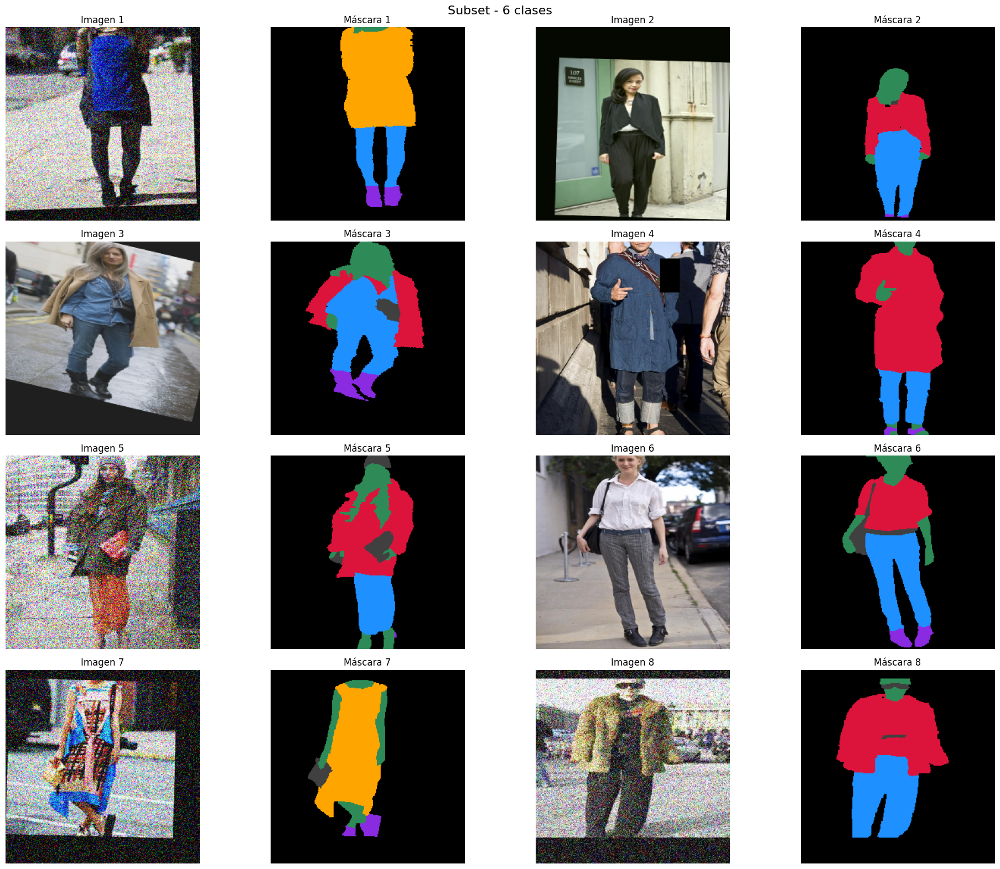


VISUALIZANDO SUBSET DE VALIDACIÓN


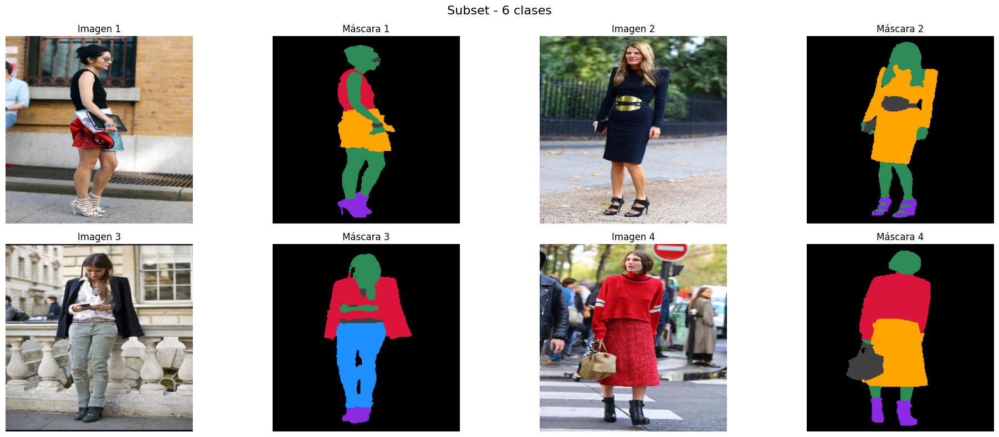


VISUALIZANDO BATCH DEL DATALOADER DE ENTRENAMIENTO


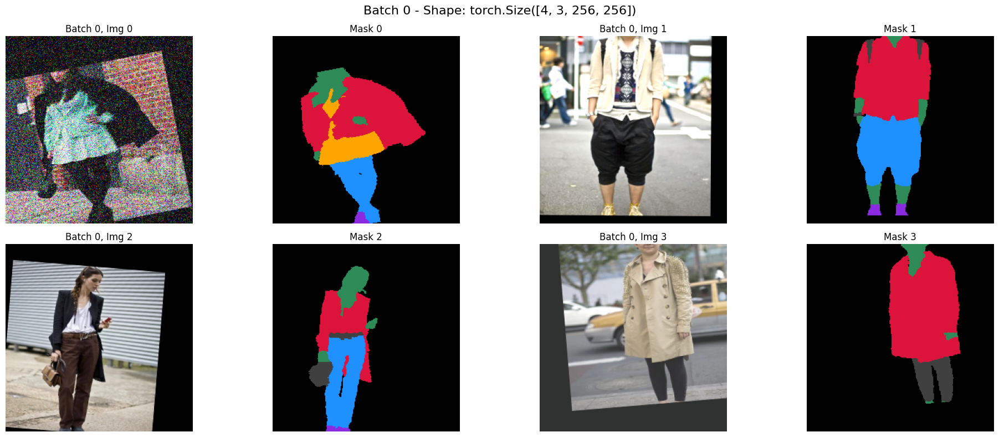


Batch 0:
  Images shape: torch.Size([4, 3, 256, 256])
  Masks shape: torch.Size([4, 256, 256])
  Unique mask values: [0, 1, 2, 3, 4, 5, 255]
    clase 0: 197169 píxeles
    clase 1: 35344 píxeles
    clase 2: 15007 píxeles
    clase 3: 3175 píxeles
    clase 4: 896 píxeles
    clase 5: 6648 píxeles
    ignore (255): 3905 píxeles
VISUALIZACIÓN DE DATOS - CONFIGURACIÓN ACTUAL
Número de clases: 6
Device: cpu
Batch size train: 4
Batch size val: 4
Batch size test: 1
Ignore index: 255


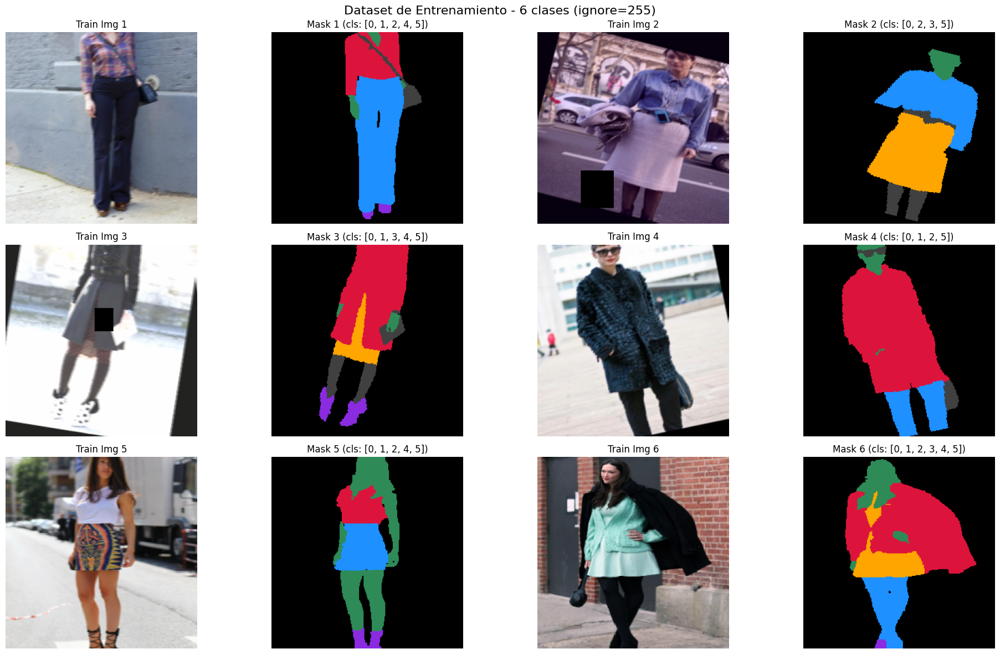


LEGENDA DE COLORES PARA LAS MÁSCARAS
  Clase  0: background   → negro
  Ignore (255): gris oscuro
  Clase  1: topwear      → rojo
  Ignore (255): gris oscuro
  Clase  2: lowerwear    → azul
  Ignore (255): gris oscuro
  Clase  3: dress        → naranja
  Ignore (255): gris oscuro
  Clase  4: footwear     → violeta
  Ignore (255): gris oscuro
  Clase  5: body         → verde
  Ignore (255): gris oscuro


In [186]:


# ---------------------------------------------------------
# Invierte normalización ImageNet → devuelve imagen RGB uint8
# ---------------------------------------------------------
def to_numpy_image(t):
    inv = tfs.Compose([
        tfs.Normalize(mean=[0,0,0], std=[1/0.229, 1/0.224, 1/0.225]),
        tfs.Normalize(mean=[-0.485, -0.456, -0.406], std=[1,1,1])
    ])
    t = inv(t)
    t = (t * 255).clamp(0,255).byte().cpu().permute(1,2,0).numpy()
    return t

# ---------------------------------------------------------
# Convierte máscara (tensor HxW con clases) a imagen visible
# ---------------------------------------------------------
def mask_to_rgb(mask, n_cls, ignore_index=255):
    """
    Convierte una máscara HxW (clases) a RGB usando colores fijos
    
    Args:
        mask: Tensor o numpy array de forma (H, W)
        n_cls: Número de clases válidas
        ignore_index: Valor para píxeles ignorados (default: 255)
    
    Returns:
        RGB image de forma (H, W, 3)
    """
    if torch.is_tensor(mask):
        mask = mask.cpu().numpy()
    
    h, w = mask.shape
    rgb = np.zeros((h, w, 3), dtype=np.int64)
    
    
    for cls_idx in range(n_cls):
        rgb[mask == cls_idx] = CLASS_COLORS[cls_idx]
    
    # ignore_index → gris oscuro (para distinguir del background)
    rgb[mask == ignore_index] = [64, 64, 64]
    
    return rgb

# ---------------------------------------------------------
# Plot helper
# ---------------------------------------------------------
def plot(ax, image, title=""):
    ax.imshow(image)
    ax.set_title(title)
    ax.axis("off")

# ---------------------------------------------------------
# Versión 1: Visualizar dataset original
# ---------------------------------------------------------
def visualize_dataset(dataset, n_ims=8):
    """
    Visualiza muestras del dataset original (CustomSegmentationDataset)
    """
    import math
    
    total_plots = n_ims * 2
    cols = 4
    rows = math.ceil(total_plots / cols)
    
    fig, axs = plt.subplots(rows, cols, figsize=(20, rows * 4))
    axs = axs.flatten()
    
    # Seleccionar índices aleatorios
    indices = random.sample(range(len(dataset)), n_ims)
    
    i = 0
    for idx in indices:
        im, gt = dataset[idx]
        
        # Convertir imagen y máscara
        rgb = to_numpy_image(im.float())
        gt_img = mask_to_rgb(gt, dataset.n_cls, dataset.ignore_index)
        
        plot(axs[i], rgb, f"Imagen {idx}")
        i += 1
        plot(axs[i], gt_img, f"Máscara (clases {np.unique(gt)})")
        i += 1
        
        if i >= len(axs):
            break
    
    # Ocultar ejes vacíos
    for j in range(i, len(axs)):
        axs[j].axis('off')
    
    plt.suptitle(f"Dataset - {n_cls} clases | ignore_index={dataset.ignore_index}", fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Mostrar estadísticas de las muestras visualizadas
    print("=" * 60)
    print(f"VISUALIZACIÓN - {n_ims} muestras del dataset")
    print("=" * 60)
    for idx in indices:
        im, gt = dataset[idx]
        unique_vals = torch.unique(gt) if torch.is_tensor(gt) else np.unique(gt)
        valid_classes = [v for v in unique_vals if v != dataset.ignore_index and v < dataset.n_cls]
        ignore_pixels = np.sum(gt == dataset.ignore_index) if hasattr(gt, '__len__') else 0
        
        print(f"Muestra {idx}: Clases presentes: {valid_classes}, Píxeles ignorados: {ignore_pixels}")

# ---------------------------------------------------------
# Versión 2: Visualizar Subset (de DataLoader)
# ---------------------------------------------------------
def visualize_subset(subset, n_ims=8):
    """
    Visualiza muestras de un Subset (como tr_dl.dataset, val_dl.dataset)
    """
    import math
    
    total_plots = n_ims * 2
    cols = 4
    rows = math.ceil(total_plots / cols)
    
    fig, axs = plt.subplots(rows, cols, figsize=(20, rows * 4))
    axs = axs.flatten()
    
    # Seleccionar índices aleatorios dentro del subset
    indices = random.sample(range(len(subset)), n_ims)
    
    i = 0
    for plot_idx, subset_idx in enumerate(indices):
        # Obtener muestra del subset
        im, gt = subset[subset_idx]
        
        # Convertir imagen y máscara
        rgb = to_numpy_image(im.float())
        
        # Necesitamos acceder al dataset original para obtener n_cls e ignore_index
        if hasattr(subset, 'dataset') and hasattr(subset.dataset, 'n_cls'):
            gt_img = mask_to_rgb(gt, subset.dataset.n_cls, subset.dataset.ignore_index)
        else:
            # Fallback si no podemos acceder al dataset original
            gt_img = mask_to_rgb(gt, n_cls, 255)
        
        plot(axs[i], rgb, f"Imagen {plot_idx+1}")
        i += 1
        plot(axs[i], gt_img, f"Máscara {plot_idx+1}")
        i += 1
        
        if i >= len(axs):
            break
    
    # Ocultar ejes vacíos
    for j in range(i, len(axs)):
        axs[j].axis('off')
    
    plt.suptitle(f"Subset - {n_cls} clases", fontsize=16)
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------
# Versión 3: Visualizar DataLoader (batch)
# ---------------------------------------------------------
def visualize_dataloader(dataloader, n_batches=1):
    """
    Visualiza batches completos de un DataLoader
    """
    for batch_idx, (images, masks) in enumerate(dataloader):
        if batch_idx >= n_batches:
            break
            
        batch_size = images.shape[0]
        cols = 4
        rows = math.ceil(batch_size * 2 / cols)
        
        fig, axs = plt.subplots(rows, cols, figsize=(20, rows * 4))
        axs = axs.flatten()
        
        i = 0
        for sample_idx in range(batch_size):
            img = images[sample_idx]
            mask = masks[sample_idx]
            
            rgb = to_numpy_image(img.float())
            
            # Acceder a n_cls desde el dataset
            if hasattr(dataloader.dataset, 'dataset'):
                gt_img = mask_to_rgb(mask, dataloader.dataset.dataset.n_cls, 
                                   dataloader.dataset.dataset.ignore_index)
            else:
                gt_img = mask_to_rgb(mask, n_cls, 255)
            
            plot(axs[i], rgb, f"Batch {batch_idx}, Img {sample_idx}")
            i += 1
            plot(axs[i], gt_img, f"Mask {sample_idx}")
            i += 1
            
            if i >= len(axs):
                break
        
        # Ocultar ejes vacíos
        for j in range(i, len(axs)):
            axs[j].axis('off')
        
        plt.suptitle(f"Batch {batch_idx} - Shape: {images.shape}", fontsize=16)
        plt.tight_layout()
        plt.show()
        
        # Estadísticas del batch
        print(f"\nBatch {batch_idx}:")
        print(f"  Images shape: {images.shape}")
        print(f"  Masks shape: {masks.shape}")
        
        unique_vals = torch.unique(masks)
        print(f"  Unique mask values: {unique_vals.tolist()}")
        
        for val in unique_vals:
            count = (masks == val).sum().item()
            if val == 255:
                print(f"    ignore (255): {count} píxeles")
            elif val < n_cls:
                print(f"    clase {val}: {count} píxeles")


# Asegurarnos de que n_cls e ignore_index estén definidos en el scope global
if 'n_cls' not in globals():
    # Preferimos tomarlo del dict `info` si está disponible
    try:
        n_cls = info.get('n_cls', None)
    except Exception:
        n_cls = None
    if n_cls is None:
        # Fallback: usar el número de class_names si existe, o un valor por defecto razonable
        n_cls = len(info.get('class_names', [])) if isinstance(info, dict) and 'class_names' in info else 6

if 'ignore_index' not in globals():
    try:
        ignore_index = info.get('ignore_index', 255)
    except Exception:
        ignore_index = 255

print("\n" + "=" * 60)
print("VISUALIZANDO SUBSET DE ENTRENAMIENTO")
print("=" * 60)
visualize_subset(tr_dl.dataset, n_ims=8)

print("\n" + "=" * 60)
print("VISUALIZANDO SUBSET DE VALIDACIÓN")
print("=" * 60)
visualize_subset(val_dl.dataset, n_ims=4)

# Opción C: Visualizar un batch del dataloader
print("\n" + "=" * 60)
print("VISUALIZANDO BATCH DEL DATALOADER DE ENTRENAMIENTO")
print("=" * 60)
visualize_dataloader(tr_dl, n_batches=1)

# ---------------------------------------------------------
# Función específica para tu caso actual
# ---------------------------------------------------------
def visualize_current():
    """
    Función específica para visualizar con tu configuración actual
    """
    print("=" * 70)
    print("VISUALIZACIÓN DE DATOS - CONFIGURACIÓN ACTUAL")
    print("=" * 70)
    print(f"Número de clases: {n_cls}")
    print(f"Device: {device}")
    print(f"Batch size train: {tr_dl.batch_size}")
    print(f"Batch size val: {val_dl.batch_size}")
    print(f"Batch size test: {test_dl.batch_size}")
    
    # Verificar acceso a ignore_index
    if hasattr(tr_dl.dataset.dataset, 'ignore_index'):
        ignore_idx = tr_dl.dataset.dataset.ignore_index
        print(f"Ignore index: {ignore_idx}")
    else:
        print("Ignore index: 255 (default)")
        ignore_idx = 255
    
    # Visualizar algunas muestras de entrenamiento
    import math
    
    n_samples = 6
    cols = 4
    rows = math.ceil(n_samples * 2 / cols)
    
    fig, axs = plt.subplots(rows, cols, figsize=(20, rows * 4))
    axs = axs.flatten()
    
    indices = random.sample(range(len(tr_dl.dataset)), n_samples)
    
    i = 0
    for plot_idx, subset_idx in enumerate(indices):
        im, gt = tr_dl.dataset[subset_idx]
        
        rgb = to_numpy_image(im.float())
        gt_img = mask_to_rgb(gt, n_cls, ignore_idx)
        
        # Obtener clases presentes en la máscara
        if torch.is_tensor(gt):
            unique_vals = torch.unique(gt).cpu().numpy()
        else:
            unique_vals = np.unique(gt)
        
        valid_classes = [int(v) for v in unique_vals if v != ignore_idx and v < n_cls]
        
        plot(axs[i], rgb, f"Train Img {plot_idx+1}")
        i += 1
        plot(axs[i], gt_img, f"Mask {plot_idx+1} (cls: {valid_classes})")
        i += 1
        
        if i >= len(axs):
            break
    
    for j in range(i, len(axs)):
        axs[j].axis('off')
    
    plt.suptitle(f'Dataset de Entrenamiento - {n_cls} clases (ignore={ignore_idx})', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Mostrar leyenda de colores
    print("\n" + "=" * 60)
    print("LEGENDA DE COLORES PARA LAS MÁSCARAS")
    print("=" * 60)
    
    for cls_name, color_name, cls_idx in CLASS_LEGEND:
        print(f"  Clase {cls_idx:2d}: {cls_name:12s} → {color_name}")
        print(f"  Ignore (255): gris oscuro")

# Ejecutar visualización
visualize_current()

### Setup de Entrenamiento

In [187]:


class OptimizedSegmentationModel(nn.Module):
    """
    Modelo optimizado para CPU con DeepLabV3Plus
    """
    def __init__(self, n_cls=6, encoder_name="resnet34",encoder_weights="imagenet", dropout_rate=0.3):
        super().__init__()
        
    
        self.model = smp.DeepLabV3Plus(
            encoder_name=encoder_name,
            encoder_weights=encoder_weights,  # Usar pesos preentrenados
            in_channels=3,
            classes=n_cls,
            activation=None, 
            encoder_dropout=dropout_rate,  # Dropout en encoder
            decoder_dropout=dropout_rate,   # Dropout en decoder
        )
        
        self.output_dropout = nn.Dropout2d(p=dropout_rate * 0.5)
        # BatchNorm extra después del modelo
       
        
        print(f"Modelo creado: DeepLabV3Plus con {encoder_name}")
        print(f"Número de parámetros: {self.count_parameters():,}")
        print(f"Clases: {n_cls}")
        print(f"Modelo con dropout={dropout_rate}")
       
        
       
    
    def forward(self, x):
        x = self.model(x)
        return x
       
    
    def count_parameters(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)

# Crear el modelo
n_cls = 6  # Deberías obtener esto de tu dataset
model = OptimizedSegmentationModel(n_cls=n_cls, encoder_name="resnet34")

# Mover a CPU
device = "cpu"
model.to(device)
print(f"Modelo en dispositivo: {device}")


class Metrics():
    
    def __init__(self, pred, gt, loss_fn, n_cls=6, ignore_index=255, eps=1e-8):
        self.pred_logits = pred
        self.pred = torch.argmax(pred, dim=1)  # (batch, H, W)
        
        # Asegurar que gt tenga la forma correcta
        if gt.dim() == 4 and gt.size(1) == 1:
            self.gt = gt.squeeze(1).long()
        elif gt.dim() == 4 and gt.size(1) > 1:
            # Si es one-hot, convertimos
            self.gt = torch.argmax(gt, dim=1).long()
        else:
            self.gt = gt.long()
        
        self.loss_fn = loss_fn
        self.n_cls = n_cls
        self.ignore_index = ignore_index
        self.eps = eps
        
        # Mover todo a CPU para cálculos de métricas
        if self.pred_logits.is_cuda:
            self.pred_logits = self.pred_logits.cpu()
            self.pred = self.pred.cpu()
            self.gt = self.gt.cpu()
            
    def IoU_per_class_detailed(self):
        """IoU por clase con estadísticas detalladas"""
        with torch.no_grad():
            valid_mask = self.gt != self.ignore_index
            
            if valid_mask.sum().item() == 0:
                return {i: {"iou": 0.0, "pixels": 0} for i in range(self.n_cls)}
            
            pred_valid = self.pred[valid_mask]
            gt_valid = self.gt[valid_mask]
            
            results = {}
            
            for cls in range(self.n_cls):
                pred_cls = pred_valid == cls
                gt_cls = gt_valid == cls
                
                intersection = (pred_cls & gt_cls).sum().float().item()
                union = (pred_cls | gt_cls).sum().float().item()
                total_pixels_cls = gt_cls.sum().float().item()
                
                if union > 0:
                    iou = (intersection + self.eps) / (union + self.eps)
                else:
                    iou = 0.0
                
                # Precisión por clase
                if pred_cls.sum() > 0:
                    precision = intersection / pred_cls.sum().float().item()
                else:
                    precision = 0.0
                
                # Recall por clase
                if total_pixels_cls > 0:
                    recall = intersection / total_pixels_cls
                else:
                    recall = 0.0
                
                results[cls] = {
                    "iou": iou,
                    "precision": precision,
                    "recall": recall,
                    "pixels": total_pixels_cls,
                    "predicted_pixels": pred_cls.sum().float().item()
                }
        
        return results        
    
    def PA(self):
        """Pixel Accuracy (Precisión por píxel)"""
        with torch.no_grad():
            # Filtrar píxeles ignorados
            valid_mask = self.gt != self.ignore_index
            
            if valid_mask.sum().item() == 0:
                return 0.0
            
            correct = (self.pred == self.gt) & valid_mask
            accuracy = correct.sum().float() / valid_mask.sum().float()
            
        return accuracy.item()
    
    def mIoU(self):
        """Mean Intersection over Union"""
        with torch.no_grad():
            # Filtrar píxeles ignorados
            valid_mask = self.gt != self.ignore_index
            
            if valid_mask.sum().item() == 0:
                return 0.0
            
            pred_valid = self.pred[valid_mask]
            gt_valid = self.gt[valid_mask]
            
            ious = []
            
            for cls in range(self.n_cls):
                pred_cls = pred_valid == cls
                gt_cls = gt_valid == cls
                
                intersection = (pred_cls & gt_cls).sum().float().item()
                union = (pred_cls | gt_cls).sum().float().item()
                
                if union > 0:
                    iou = (intersection + self.eps) / (union + self.eps)
                    ious.append(iou)
                else:
                    # Si no hay píxeles de esta clase, omitimos
                    continue
            
            if len(ious) == 0:
                return 0.0
            
            miou = sum(ious) / len(ious)
        
        return miou
    
    def IoU_per_class(self):
        """IoU por clase"""
        with torch.no_grad():
            valid_mask = self.gt != self.ignore_index
            
            if valid_mask.sum().item() == 0:
                return {f"class_{i}": 0.0 for i in range(self.n_cls)}
            
            pred_valid = self.pred[valid_mask]
            gt_valid = self.gt[valid_mask]
            
            ious = {}
            
            for cls in range(self.n_cls):
                pred_cls = pred_valid == cls
                gt_cls = gt_valid == cls
                
                intersection = (pred_cls & gt_cls).sum().float().item()
                union = (pred_cls | gt_cls).sum().float().item()
                
                if union > 0:
                    iou = (intersection + self.eps) / (union + self.eps)
                    ious[f"class_{cls}"] = iou
                else:
                    ious[f"class_{cls}"] = 0.0
        
        return ious
    
   
    





Modelo creado: DeepLabV3Plus con resnet34
Número de parámetros: 22,438,742
Clases: 6
Modelo con dropout=0.3
Modelo en dispositivo: cpu


In [188]:
def calculate_class_weights(dataset, n_cls=6, ignore_index=255):
    pixel_counts = np.zeros(n_cls, dtype=np.int64)
    total_pixels = 0

    for i in range(len(dataset)):
        _, mask = dataset[i]
        if torch.is_tensor(mask):
            mask = mask.numpy()

        valid = mask != ignore_index
        total_pixels += valid.sum()

        for cls in range(n_cls):
            pixel_counts[cls] += np.sum(mask[valid] == cls)

    class_freq = pixel_counts / (total_pixels + 1e-6)

    class_weights = 1.0 / (class_freq + 1e-6)
    class_weights = class_weights / class_weights.sum() * n_cls
    class_weights = np.clip(class_weights, 0.5, 5.0)

    print("Distribución de clases:", class_freq)
    print("Pesos calculados:", class_weights)

    return torch.tensor(class_weights, dtype=torch.float32)


In [189]:
# Calcular pesos de clase desde el dataset (tr_dl puede ser un DataLoader)
dataset_for_weights = tr_dl.dataset if isinstance(tr_dl, DataLoader) else tr_dl

class_weights = calculate_class_weights(dataset_for_weights, n_cls=n_cls, ignore_index=255)

# Mover a dispositivo si es un tensor
if isinstance(class_weights, torch.Tensor):
    class_weights = class_weights.to(device)

print("Class weights:", class_weights)

Distribución de clases: [0.7524836  0.10086926 0.0586283  0.03802228 0.00668313 0.04331343]
Pesos calculados: [0.5        0.5        0.5        0.69424743 3.94928803 0.60944051]
Class weights: tensor([0.5000, 0.5000, 0.5000, 0.6942, 3.9493, 0.6094])


In [190]:

class DiceLoss(nn.Module):
    def __init__(
        self,
        mode="multiclass",
        classes=None,
        log_loss=False,
        smooth=1e-6,
        ignore_index=255
    ):
        super().__init__()
        assert mode == "multiclass", "Esta implementación es solo para multiclase"
        self.classes = classes
        self.log_loss = log_loss
        self.smooth = smooth
        self.ignore_index = ignore_index

    def forward(self, logits, target):
        """
        logits: (B, C, H, W)
        target: (B, H, W)
        """
        num_classes = logits.shape[1]
    
        # Máscara válida
        valid_mask = target != self.ignore_index  # (B, H, W)
    
        # Reemplazar ignore_index por una clase válida dummy (0)
        target_safe = target.clone()
        target_safe[target_safe == self.ignore_index] = 0
    
        # Softmax
        probs = F.softmax(logits, dim=1)
    
        # One-hot SEGURO
        target_one_hot = F.one_hot(
            target_safe, num_classes=num_classes
        ).permute(0, 3, 1, 2).float()
    
        # Aplicar máscara
        valid_mask = valid_mask.unsqueeze(1)
        probs = probs * valid_mask
        target_one_hot = target_one_hot * valid_mask
    
        # Dice
        dims = (0, 2, 3)
        intersection = torch.sum(probs * target_one_hot, dims)
        cardinality = torch.sum(probs + target_one_hot, dims)
    
        dice = (2.0 * intersection + self.smooth) / (cardinality + self.smooth)
    
        if self.classes is not None:
            dice = dice[self.classes]
    
        loss = 1.0 - dice
        return loss.mean()



In [191]:
class FocalLoss(nn.Module):
    def __init__(
        self,
        gamma=2.0,
        weight=None,
        ignore_index=255,
        reduction="mean"
    ):
        super().__init__()
        self.gamma = gamma
        self.ignore_index = ignore_index
        self.reduction = reduction
        self.ce = nn.CrossEntropyLoss(
            weight=weight,
            ignore_index=ignore_index,
            reduction="none"
        )

    def forward(self, logits, target):
        """
        logits: (B, C, H, W)
        target: (B, H, W)
        """
        ce_loss = self.ce(logits, target)  # (B, H, W)

        # pt = probabilidad del target correcto
        pt = torch.exp(-ce_loss)

        focal_loss = ((1 - pt) ** self.gamma) * ce_loss

        if self.reduction == "mean":
            return focal_loss.mean()
        elif self.reduction == "sum":
            return focal_loss.sum()
        else:
            return focal_loss


In [192]:
class CombinedLoss(nn.Module):
    def __init__(self, class_weights, n_cls=6, ignore_index = 255):
        super().__init__()

        self.ce_loss = nn.CrossEntropyLoss(
            weight=class_weights,
            ignore_index=ignore_index
        )

        self.dice_loss = DiceLoss(
            mode="multiclass",
            classes=list(range(n_cls)),
            log_loss=False,
            ignore_index=ignore_index
        )

        self.focal_loss = FocalLoss(
            gamma=2.0,
            weight=class_weights,
            ignore_index=ignore_index
        )

        self.weights = [0.4, 0.3, 0.3]

    def forward(self, pred, target):
        ce = self.ce_loss(pred, target)
        dice = self.dice_loss(pred, target)
        focal = self.focal_loss(pred, target)

        return (
            self.weights[0] * ce +
            self.weights[1] * dice +
            self.weights[2] * focal
        )


In [193]:
def get_optimizer_and_scheduler(model, lr=3e-4):
    # Optimizador con warmup
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=1e-4,  # Regularización L2
        betas=(0.9, 0.999)
    )
    
    # Scheduler con warmup y cosine annealing
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=lr,
        epochs=80,
        steps_per_epoch=len(tr_dl),
        pct_start=0.1,  # 10% warmup
        anneal_strategy='cos'
    )
    
    return optimizer, scheduler

### Entrenamiento y validacion

In [194]:
class CPUTrainer:
    """
    Trainer optimizado para entrenamiento en CPU
    """
    def __init__(self, model, train_loader, val_loader, 
                 criterion, optimizer, scheduler=None,
                 device="cpu", n_cls=6, ignore_index=255,patience=10,delta=0.001,min_epochs=20):
        
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.criterion = criterion
        self.optimizer = optimizer
        self.scheduler = scheduler
        self.device = device
        self.n_cls = n_cls
        self.ignore_index = ignore_index
        
        # Parámetros para Early Stopping
        self.patience = patience  # Número de épocas sin mejora para detener
        self.delta = delta  # Cambio mínimo para considerar mejora
        self.min_epochs = min_epochs
        self.counter = 0  # Contador de épocas sin mejora
        self.best_score = None
        self.best_state = None
        self.early_stop = False
        
        # Historial
        self.history = {
            'train_loss': [],
            'val_loss': [],
            'train_pa': [],
            'val_pa': [],
            'train_miou': [],
            'val_miou': [],
            'lr': [],
            'per_class_iou': []
        }
    
    def _early_stopping(self, val_miou,val_loss, epoch):
        """Early stopping mejorado"""
        # No considerar early stopping antes de min_epochs
        if epoch < self.min_epochs:
            return False
            
        if self.best_score is None:
            self.best_score = val_miou
            # Guardar estado del modelo
            self.best_state = {
                'model_state': self.model.state_dict(),
                'optimizer_state': self.optimizer.state_dict(),
                'epoch': epoch,
                'score': val_miou,
                'val_loss_min': val_loss
            }
            return False
            
        elif val_miou < self.best_score + self.delta:
            self.counter += 1
            print(f"   EarlyStopping: {self.counter}/{self.patience} sin mejora")
            
            if self.counter >= self.patience:
                self.early_stop = True
                # Restaurar mejor modelo
                if self.best_state:
                    self.model.load_state_dict(self.best_state['model_state'])
                    self.optimizer.load_state_dict(self.best_state['optimizer_state'])
                return True
        else:
            print(f"  ✓ Mejora significativa: {val_miou:.4f} > {self.best_score:.4f}")
            self.best_score = val_miou
            self.counter = 0
            # Actualizar mejor estado
            self.best_state = {
                'model_state': self.model.state_dict(),
                'optimizer_state': self.optimizer.state_dict(),
                'epoch': epoch,
                'score': val_miou
            }
            
        return False
        
    def train_epoch(self):
        """Entrena una época"""
        self.model.train()
        total_loss = 0.0
        total_pa = 0.0
        total_miou = 0.0
        num_batches = 0
        
        for batch_idx, (images, masks) in enumerate(self.train_loader):
            # Mover a dispositivo
            images = images.to(self.device).float()
            masks = masks.to(self.device).long()
            
            # Forward pass
            self.optimizer.zero_grad()
            outputs = self.model(images)
            
            # Calcular pérdida
            loss = self.criterion(outputs, masks)
            
            # Backward pass
            loss.backward()
            torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
            self.optimizer.step()
            self.scheduler.step() # AQUÍ
            
            
            
            
            
            # Calcular métricas
            with torch.no_grad():
                metrics = Metrics(outputs, masks, self.criterion,
                                 n_cls=self.n_cls, 
                                 ignore_index=self.ignore_index)
                pa = metrics.PA()
                miou = metrics.mIoU()
            
            total_loss += loss.item()
            total_pa += pa
            total_miou += miou
            num_batches += 1
            
            # Log cada cierto número de batches
            if (batch_idx + 1) % 10 == 0:
                print(f"  Batch {batch_idx+1}/{len(self.train_loader)}: "
                      f"Loss: {loss.item():.4f}, PA: {pa:.4f}, mIoU: {miou:.4f}")
        
        return {
            'loss': total_loss / max(num_batches,1),
            'pa': total_pa / max(num_batches,1),
            'miou': total_miou / max(num_batches,1)
        }
    
    def validate(self):
        """Validación"""
        self.model.eval()
        total_loss = 0.0
        total_pa = 0.0
        total_miou = 0.0
        num_batches = 0
        
        with torch.no_grad():
            for images, masks in self.val_loader:
                images = images.to(self.device).float()
                masks = masks.to(self.device).long()
                
                outputs = self.model(images)
                loss = self.criterion(outputs, masks)
                
                metrics = Metrics(outputs, masks, self.criterion,
                                 n_cls=self.n_cls,
                                 ignore_index=self.ignore_index)
                pa = metrics.PA()
                miou = metrics.mIoU()
                
                total_loss += loss.item()
                total_pa += pa
                total_miou += miou
                num_batches += 1
        
        return {
            'loss': total_loss / max(num_batches,1),
            'pa': total_pa / max(num_batches,1),
            'miou': total_miou / max(num_batches,1)
        }
    
    def compute_epoch_iou(self):
        intersection = torch.zeros(self.n_cls, device=self.device)
        union = torch.zeros(self.n_cls, device=self.device)
    
        with torch.no_grad():
            for images, masks in self.val_loader:
                images = images.to(self.device)
                masks = masks.to(self.device)
    
                outputs = self.model(images)
                preds = torch.argmax(outputs, dim=1)
    
                valid = masks != self.ignore_index
    
                for cls in range(self.n_cls):
                    pred_cls = (preds == cls) & valid
                    gt_cls = (masks == cls) & valid
    
                    intersection[cls] += (pred_cls & gt_cls).sum()
                    union[cls] += (pred_cls | gt_cls).sum()
    
        return {
            f"class_{i}": (intersection[i] / (union[i] + 1e-6)).item()
            for i in range(self.n_cls)
        }
    
    
    
    def train(self, num_epochs, save_path="best_model_mejorado.pth"):
        """Entrenamiento completo"""
        best_miou = 0.0
        
        print("\n" + "="*60)
        print("INICIANDO ENTRENAMIENTO EN CPU")
        print("="*60)
        
        print(f"Early Stopping configurado: paciencia={self.patience}, delta={self.delta}")
        
        for epoch in range(num_epochs):
            start_time = time.time()
            
            print(f"\nEpoch {epoch+1}/{num_epochs}")
            print("-"*40)
            
            # Entrenar
            train_metrics = self.train_epoch()
            
            # Validar
            val_metrics = self.validate()
            
            # Calcular métricas por clase
            with torch.no_grad():
            # Tomar un batch de validación
                for images, masks in self.val_loader:
                    images = images.to(self.device)
                    masks = masks.to(self.device)
                
                    outputs = self.model(images)
                    metrics = Metrics(outputs, masks, self.criterion,
                                n_cls=self.n_cls, 
                                ignore_index=self.ignore_index)
                per_class_iou = metrics.IoU_per_class_detailed()
                
            
            # Guardar en historial
            self.history['train_loss'].append(train_metrics['loss'])
            self.history['val_loss'].append(val_metrics['loss'])
            self.history['train_pa'].append(train_metrics['pa'])
            self.history['val_pa'].append(val_metrics['pa'])
            self.history['train_miou'].append(train_metrics['miou'])
            self.history['val_miou'].append(val_metrics['miou'])
            self.history['lr'].append(self.optimizer.param_groups[0]['lr'])
            self.history['per_class_iou'].append(per_class_iou)
            
            # Tiempo de la época
            epoch_time = time.time() - start_time
            
            # Mostrar resultados
            print(f"\nResumen Epoch {epoch+1}:")
            print(f"  Tiempo: {epoch_time:.2f}s")
            print(f"  Train Loss: {train_metrics['loss']:.4f} | "
                  f"PA: {train_metrics['pa']:.4f} | "
                  f"mIoU: {train_metrics['miou']:.4f}")
            print(f"  Val Loss:   {val_metrics['loss']:.4f} | "
                  f"PA: {val_metrics['pa']:.4f} | "
                  f"mIoU: {val_metrics['miou']:.4f}")
            print(f"  Learning Rate: {self.optimizer.param_groups[0]['lr']:.6f}")
            
            # Guardar mejor modelo
            if val_metrics['miou'] > best_miou:
                best_miou = val_metrics['miou']
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': self.model.state_dict(),
                    'optimizer_state_dict': self.optimizer.state_dict(),
                    'val_miou': best_miou,
                    'history': self.history,
                }, save_path)
                print(f"  ✓ Modelo guardado (mIoU: {best_miou:.4f})")
            
            

            
            # Verificar Early Stopping (pasando el número de época)
            if self._early_stopping(val_metrics['miou'], val_metrics['loss'], epoch):
                print(f"\n{'='*60}")
                print("EARLY STOPPING ACTIVADO")
                print(f"Sin mejora significativa por {self.patience} épocas")
                print(f"Mejor mIoU alcanzado: {best_miou:.4f}")
                print(f"Entrenamiento detenido en época {epoch+1}")
                print('='*60)
                break
        
        # print("\n" + "="*60)
        # print("ENTRENAMIENTO COMPLETADO")
        # print(f"Mejor mIoU: {best_miou:.4f}")
        # print("="*60)
        
        if not self.early_stop:
            print("\n" + "="*60)
            print("ENTRENAMIENTO COMPLETADO (sin early stopping)")
            print(f"Mejor mIoU: {best_miou:.4f}")
            print("="*60)
        
        return self.history

In [195]:
def plot_class_metrics(history, class_names):
    """Visualiza métricas por clase a través del tiempo"""
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Extraer IoU por clase por época
    epochs = range(len(history['per_class_iou']))
    
    for cls, cls_name in enumerate(class_names):
        row = cls // 3
        col = cls % 3
        
        iou_values = []
        for epoch_iou in history['per_class_iou']:
            if cls in epoch_iou:
                iou_values.append(epoch_iou[cls]['iou'])
            else:
                iou_values.append(0)
        
        axes[row, col].plot(epochs, iou_values, 'b-', linewidth=2)
        axes[row, col].set_title(f'{cls_name} (Clase {cls})')
        axes[row, col].set_xlabel('Época')
        axes[row, col].set_ylabel('IoU')
        axes[row, col].grid(True, alpha=0.3)
        
        # Añadir mejor IoU
        best_iou = max(iou_values) if iou_values else 0
        axes[row, col].axhline(y=best_iou, color='r', linestyle='--', alpha=0.5)
        axes[row, col].text(0.5, 0.95, f'Mejor: {best_iou:.3f}', 
                          transform=axes[row, col].transAxes,
                          ha='center', va='top',
                          bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle('Evolución del IoU por Clase', fontsize=16)
    plt.tight_layout()
    plt.show()

In [196]:
# FUNCIÓN DE ENTRENAMIENTO
# ============================================
def entrenamiento(tr_dl, val_dl, n_cls=6, class_names=None):
    """
    Inicia el entrenamiento del modelo
    
    Args:
        tr_dl: DataLoader de entrenamiento
        val_dl: DataLoader de validación
        n_cls: Número de clases (debería ser 8 según tu mapeo)
    """
    # Configuración
    device = "cpu"
    ignore_index = 255
    num_epochs = 80  # a 100 Reducido para prueba, puedes aumentarlo
    learning_rate = 3e-4  #3e-4
    dropout_rate = 0.3
    
    # Parámetros para Early Stopping
    patience = 15  # Número de épocas sin mejora para detener
    delta = 0.001  # Mejora mínima requerida
    min_epochs = 15
    
    print("="*60)
    print("CONFIGURACIÓN DEL ENTRENAMIENTO")
    print("="*60)
    print(f"Dispositivo: {device}")
    print(f"Número de clases: {n_cls}")
    print(f"Índice ignore: {ignore_index}")
    print(f"Épocas: {num_epochs}")
    print(f"Early stopping: paciencia={patience}, delta={delta}")
    print(f"Learning rate: {learning_rate}")
    print(f"Tamaño batch entrenamiento: {tr_dl.batch_size}")
    print(f"Tamaño batch validación: {val_dl.batch_size}")
    print(f" Dropout: {dropout_rate}")
    
    print("\nCalculando pesos de clase...")
    
      
    
    
    # 1. Crear modelo - USAR RESNET18 EN LUGAR DE RESNET32
    print("\nCreando modelo...")
    model = OptimizedSegmentationModel(
        n_cls=n_cls,
        encoder_name="resnet34",  
        encoder_weights="imagenet",
        dropout_rate= dropout_rate
    ).to(device)
    
    class_weights = calculate_class_weights(tr_dl.dataset, n_cls, ignore_index).to(device)
    
    criterion = CombinedLoss(
        n_cls=n_cls,
        ignore_index=ignore_index,
        class_weights = class_weights,
        
    )
    
    # 4. Optimizador y OneCycleLR
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=learning_rate,
        weight_decay=1e-4
    )
    
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=learning_rate,
        epochs=num_epochs,
        steps_per_epoch=len(tr_dl),
        pct_start=0.1,
        anneal_strategy='cos'
    )
    
    
    
    
    #  Crear trainer
    print("\nCreando trainer...")
    trainer = CPUTrainer(
        model=model,
        train_loader=tr_dl,
        val_loader=val_dl,
        criterion=criterion,
        optimizer=optimizer,
        scheduler=scheduler,
        device=device,
        n_cls=n_cls,
        ignore_index=ignore_index,
        patience=patience,
        delta=delta,
        min_epochs=min_epochs
    )
    
    # 6. Entrenar
    print("\nIniciando entrenamiento...")
    history = trainer.train(num_epochs=num_epochs, save_path="best_model_mejorado.pth")
    
    if class_names:
        plot_class_metrics(history, class_names)
        
    return model, history

In [197]:


def verificar_dataloaders(tr_dl, val_dl):
    """Verifica que los DataLoaders tengan los tipos y clases correctas"""
    print("=" * 60)
    print("VERIFICACIÓN DE DATALOADERS")
    print("=" * 60)

    # Mapeo id → nombre
    class_id_to_name = {
        0: "background",
        1: "topwear",
        2: "lowerwear",
        3: "dress",
        4: "footwear",
        5: "body",
        255: "ignore"
    }

    # -------------------------
    # Batch de entrenamiento
    # -------------------------
    images, masks = next(iter(tr_dl))

    print("\nBatch de entrenamiento:")
    print(f"  Images dtype: {images.dtype}, shape: {images.shape}")
    print(f"  Masks dtype:  {masks.dtype}, shape: {masks.shape}")
    print(f"  Images range: [{images.min():.3f}, {images.max():.3f}]")
    print(f"  Masks unique values: {torch.unique(masks).tolist()}")

    # Verificar tipo de máscara
    if masks.dtype != torch.int64:
        print(f"\n  ADVERTENCIA: Máscaras son {masks.dtype}, deberían ser torch.int64 (Long)")
        print("   Convirtiendo a Long...")
        masks = masks.long()
        print(f"   Nuevo dtype: {masks.dtype}")

    # -------------------------
    # Batch de validación
    # -------------------------
    images_val, masks_val = next(iter(val_dl))

    print("\nBatch de validación:")
    print(f"  Images dtype: {images_val.dtype}, shape: {images_val.shape}")
    print(f"  Masks dtype:  {masks_val.dtype}, shape: {masks_val.shape}")

    # -------------------------
    # Ignore index
    # -------------------------
    ignore_count_train = (masks == 255).sum().item()
    ignore_count_val = (masks_val == 255).sum().item()

    print("\nPíxeles ignorados (255):")
    print(f"  Train: {ignore_count_train}")
    print(f"  Val:   {ignore_count_val}")

    # -------------------------
    # Clases presentes (train)
    # -------------------------
    print("\nClases presentes en batch de entrenamiento:")
    unique_classes = torch.unique(masks)

    for cls in unique_classes:
        cls_id = int(cls.item())
        pixel_count = (masks == cls).sum().item()
        cls_name = class_id_to_name.get(cls_id, "UNKNOWN")

        print(f"  Clase {cls_id:>3} ({cls_name:<10}) → {pixel_count} píxeles")

    return True


# Paso 1: Verificar DataLoaders
print("Paso 1: Verificando DataLoaders...")
verificar_dataloaders(tr_dl, val_dl)

# Paso 2: Crear función de conversión de tipos si es necesario
def fix_dataloader_types(dataloader):
    """Función generadora que convierte máscaras a Long"""
    for images, masks in dataloader:
        yield images, masks.long()

def verificar_varios_batches(dataloader, n_batches=10):
    class_counts = {}
    for i, (_, masks) in enumerate(dataloader):
        if i >= n_batches:
            break
        for cls in torch.unique(masks):
            cls = int(cls.item())
            class_counts[cls] = class_counts.get(cls, 0) + 1

    print("\nClases vistas en", n_batches, "batches:")
    for cls, count in sorted(class_counts.items()):
        print(f"  Clase {cls}: aparece en {count} batches")


Paso 1: Verificando DataLoaders...
VERIFICACIÓN DE DATALOADERS

Batch de entrenamiento:
  Images dtype: torch.float32, shape: torch.Size([4, 3, 256, 256])
  Masks dtype:  torch.int64, shape: torch.Size([4, 256, 256])
  Images range: [-2.118, 2.640]
  Masks unique values: [0, 1, 2, 3, 4, 5, 255]

Batch de validación:
  Images dtype: torch.float32, shape: torch.Size([4, 3, 256, 256])
  Masks dtype:  torch.int64, shape: torch.Size([4, 256, 256])

Píxeles ignorados (255):
  Train: 4075
  Val:   6595

Clases presentes en batch de entrenamiento:
  Clase   0 (background) → 192303 píxeles
  Clase   1 (topwear   ) → 29850 píxeles
  Clase   2 (lowerwear ) → 9351 píxeles
  Clase   3 (dress     ) → 11511 píxeles
  Clase   4 (footwear  ) → 931 píxeles
  Clase   5 (body      ) → 14123 píxeles
  Clase 255 (ignore    ) → 4075 píxeles


Verificando configuración...
tr_dl definido: True
val_dl definido: True
n_cls: 6
CONFIGURACIÓN DEL ENTRENAMIENTO
Dispositivo: cpu
Número de clases: 6
Índice ignore: 255
Épocas: 80
Early stopping: paciencia=15, delta=0.001
Learning rate: 0.0003
Tamaño batch entrenamiento: 4
Tamaño batch validación: 4
 Dropout: 0.3

Calculando pesos de clase...

Creando modelo...
Modelo creado: DeepLabV3Plus con resnet34
Número de parámetros: 22,438,742
Clases: 6
Modelo con dropout=0.3
Distribución de clases: [0.75137613 0.10135447 0.05910229 0.03842691 0.00647621 0.04326399]
Pesos calculados: [0.5        0.5        0.5        0.67404747 3.99897941 0.5986881 ]

Creando trainer...

Iniciando entrenamiento...

INICIANDO ENTRENAMIENTO EN CPU
Early Stopping configurado: paciencia=15, delta=0.001

Epoch 1/80
----------------------------------------
  Batch 10/200: Loss: 1.1526, PA: 0.1242, mIoU: 0.0574
  Batch 20/200: Loss: 1.1461, PA: 0.1633, mIoU: 0.0639
  Batch 30/200: Loss: 1.1008, PA: 0.2276, mIoU: 0.092

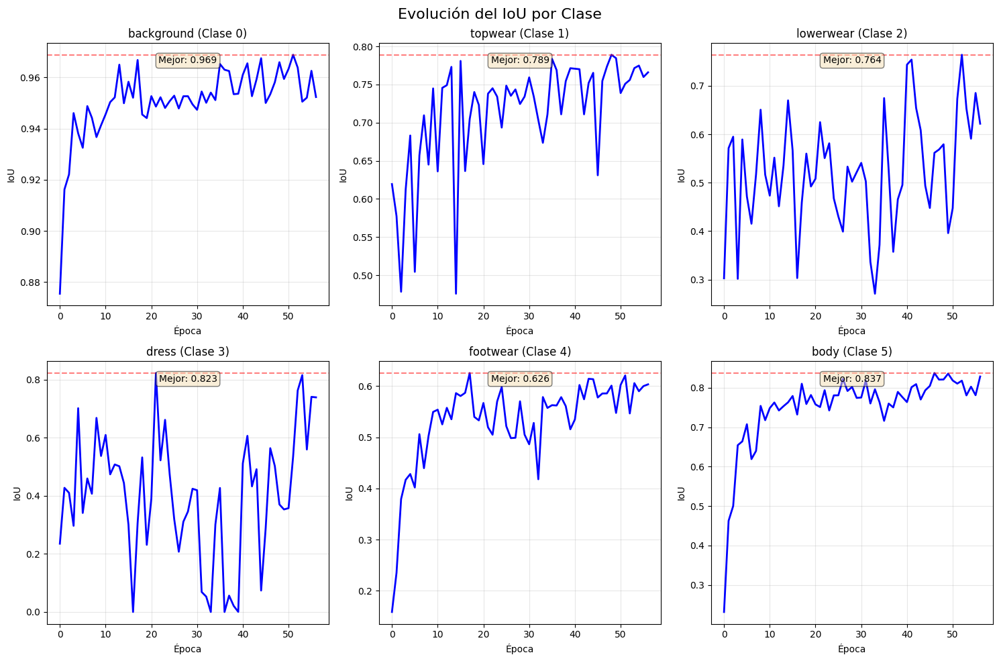

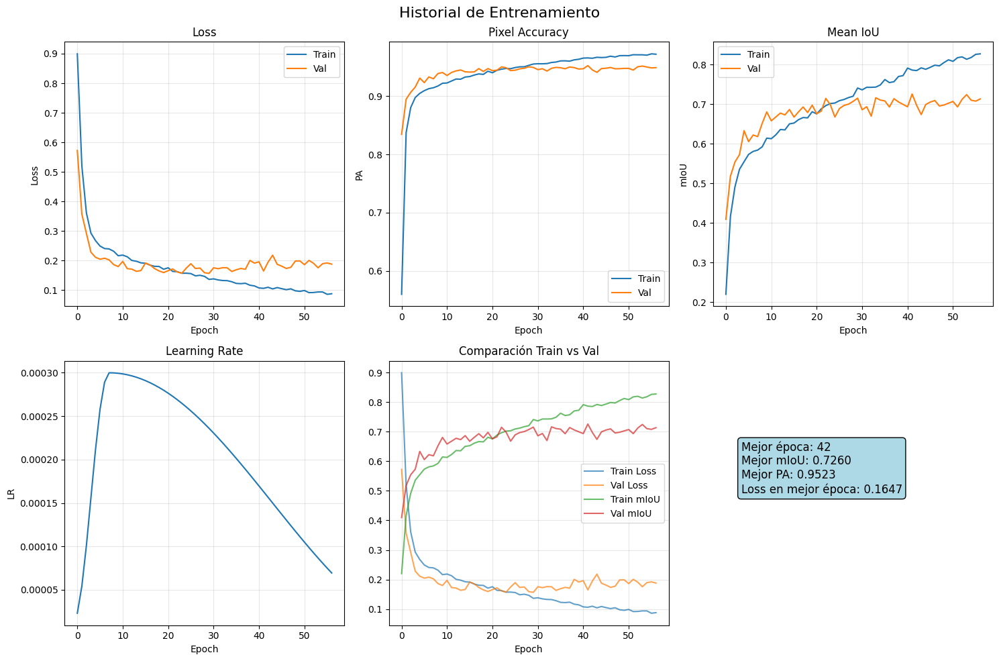


¡Entrenamiento completado exitosamente!
Historial guardado. Mejor mIoU: 0.7260


In [198]:
# FUNCIÓN PARA VISUALIZAR RESULTADOS
# ============================================
def plot_training_history(history):
    """Visualiza el historial de entrenamiento"""
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Pérdida
    axes[0, 0].plot(history['train_loss'], label='Train')
    axes[0, 0].plot(history['val_loss'], label='Val')
    axes[0, 0].set_title('Loss')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # Pixel Accuracy
    axes[0, 1].plot(history['train_pa'], label='Train')
    axes[0, 1].plot(history['val_pa'], label='Val')
    axes[0, 1].set_title('Pixel Accuracy')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('PA')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    
    # mIoU
    axes[0, 2].plot(history['train_miou'], label='Train')
    axes[0, 2].plot(history['val_miou'], label='Val')
    axes[0, 2].set_title('Mean IoU')
    axes[0, 2].set_xlabel('Epoch')
    axes[0, 2].set_ylabel('mIoU')
    axes[0, 2].legend()
    axes[0, 2].grid(True, alpha=0.3)
    
    # Learning Rate
    axes[1, 0].plot(history['lr'])
    axes[1, 0].set_title('Learning Rate')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('LR')
    axes[1, 0].grid(True, alpha=0.3)
    
    # Comparación Train vs Val
    axes[1, 1].plot(history['train_loss'], label='Train Loss', alpha=0.7)
    axes[1, 1].plot(history['val_loss'], label='Val Loss', alpha=0.7)
    axes[1, 1].plot(history['train_miou'], label='Train mIoU', alpha=0.7)
    axes[1, 1].plot(history['val_miou'], label='Val mIoU', alpha=0.7)
    axes[1, 1].set_title('Comparación Train vs Val')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    
    # Mejor época (basado en val_miou)
    best_epoch = np.argmax(history['val_miou'])
    axes[1, 2].text(0.1, 0.5, 
                   f"Mejor época: {best_epoch + 1}\n"
                   f"Mejor mIoU: {history['val_miou'][best_epoch]:.4f}\n"
                   f"Mejor PA: {history['val_pa'][best_epoch]:.4f}\n"
                   f"Loss en mejor época: {history['val_loss'][best_epoch]:.4f}",
                   fontsize=12, 
                   bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue"))
    axes[1, 2].axis('off')
    
    plt.suptitle('Historial de Entrenamiento', fontsize=16)
    plt.tight_layout()
    plt.show()

# ============================================
# EJECUTAR ENTRENAMIENTO
# ============================================

print("Verificando configuración...")
print(f"tr_dl definido: {'tr_dl' in locals() or 'tr_dl' in globals()}")
print(f"val_dl definido: {'val_dl' in locals() or 'val_dl' in globals()}")
print(f"n_cls: {n_cls if 'n_cls' in locals() or 'n_cls' in globals() else 'No definido'}")

# Si todo está bien, ejecutar entrenamiento
if 'tr_dl' in locals() and 'val_dl' in locals():
    try:
        
        # Iniciar entrenamiento
        model, history = entrenamiento(tr_dl, val_dl, n_cls=info['n_cls'],class_names=info['class_names'])
        
        # Visualizar resultados
        plot_training_history(history)
        
        print("\n¡Entrenamiento completado exitosamente!")
        print(f"Historial guardado. Mejor mIoU: {max(history['val_miou']):.4f}")
        
    except Exception as e:
        print(f"\nError durante el entrenamiento: {e}")
        
else:
    print("\nError: tr_dl y/o val_dl no están definidos")
    
    

In [229]:
train_acc_final = history['train_pa'][-1]
val_acc_final   = history['val_pa'][-1]

print(f"Train Accuracy final: {train_acc_final:.4f}")
print(f"Val/Test Accuracy final: {val_acc_final:.4f}")

best_epoch = np.argmax(history['val_miou'])

train_acc_best = history['train_pa'][best_epoch]
val_acc_best   = history['val_pa'][best_epoch]

print(f"Mejor época: {best_epoch + 1}")
print(f"Train Accuracy (mejor época): {train_acc_best:.4f}")
print(f"Val/Test Accuracy (mejor época): {val_acc_best:.4f}")



Train Accuracy final: 0.9718
Val/Test Accuracy final: 0.9488
Mejor época: 42
Train Accuracy (mejor época): 0.9655
Val/Test Accuracy (mejor época): 0.9523


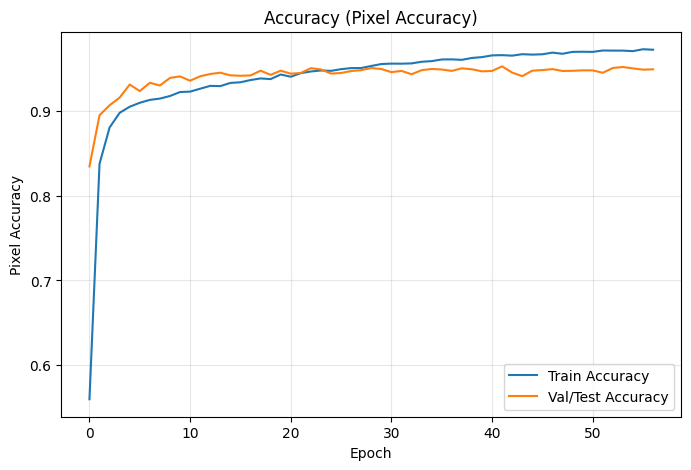

In [230]:
def plot_accuracy(history):
    plt.figure(figsize=(8,5))
    plt.plot(history['train_pa'], label='Train Accuracy')
    plt.plot(history['val_pa'], label='Val/Test Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Pixel Accuracy')
    plt.title('Accuracy (Pixel Accuracy)')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

plot_accuracy(history)


In [231]:
def evaluate_accuracy(model, test_loader, device, n_cls, ignore_index):
    model.eval()
    total_pa = 0
    num_batches = 0

    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            metrics = Metrics(outputs, masks, None,
                              n_cls=n_cls,
                              ignore_index=ignore_index)
            total_pa += metrics.PA()
            num_batches += 1

    return total_pa / num_batches


In [232]:
test_accuracy = evaluate_accuracy(
    model,
    test_dl,
    device="cpu",
    n_cls=n_cls,
    ignore_index=255
)

print(f"Test Accuracy final: {test_accuracy:.4f}")


Test Accuracy final: 0.9508


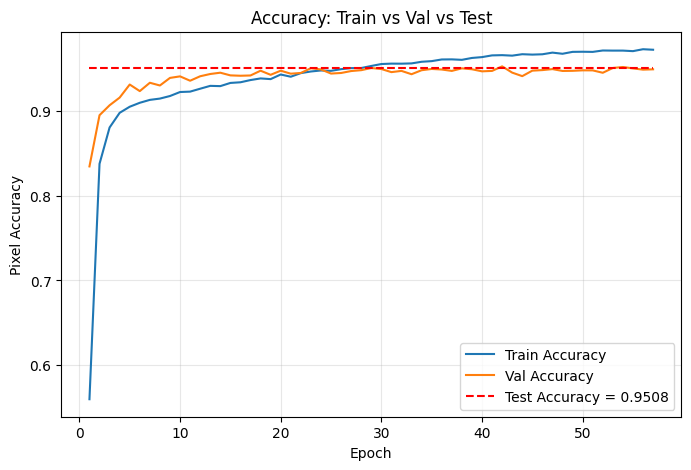

In [233]:
def plot_accuracy_with_test(history, test_accuracy):
    epochs = range(1, len(history['train_pa']) + 1)

    plt.figure(figsize=(8,5))
    plt.plot(epochs, history['train_pa'], label='Train Accuracy')
    plt.plot(epochs, history['val_pa'], label='Val Accuracy')

    # Línea horizontal del test
    plt.hlines(
        y=test_accuracy,
        xmin=1,
        xmax=len(epochs),
        colors='red',
        linestyles='dashed',
        label=f'Test Accuracy = {test_accuracy:.4f}'
    )

    plt.xlabel('Epoch')
    plt.ylabel('Pixel Accuracy')
    plt.title('Accuracy: Train vs Val vs Test')
    plt.legend()
    plt.grid(alpha=0.3)

plot_accuracy_with_test(history, test_accuracy)


In [199]:
CLASS_NAMES = {
    0: "background",
    1: "topwear",
    2: "lowerwear",
    3: "dress",
    4: "footwear",
    5: "body",

}


VISUALIZANDO PREDICCIONES EN VALIDACIÓN


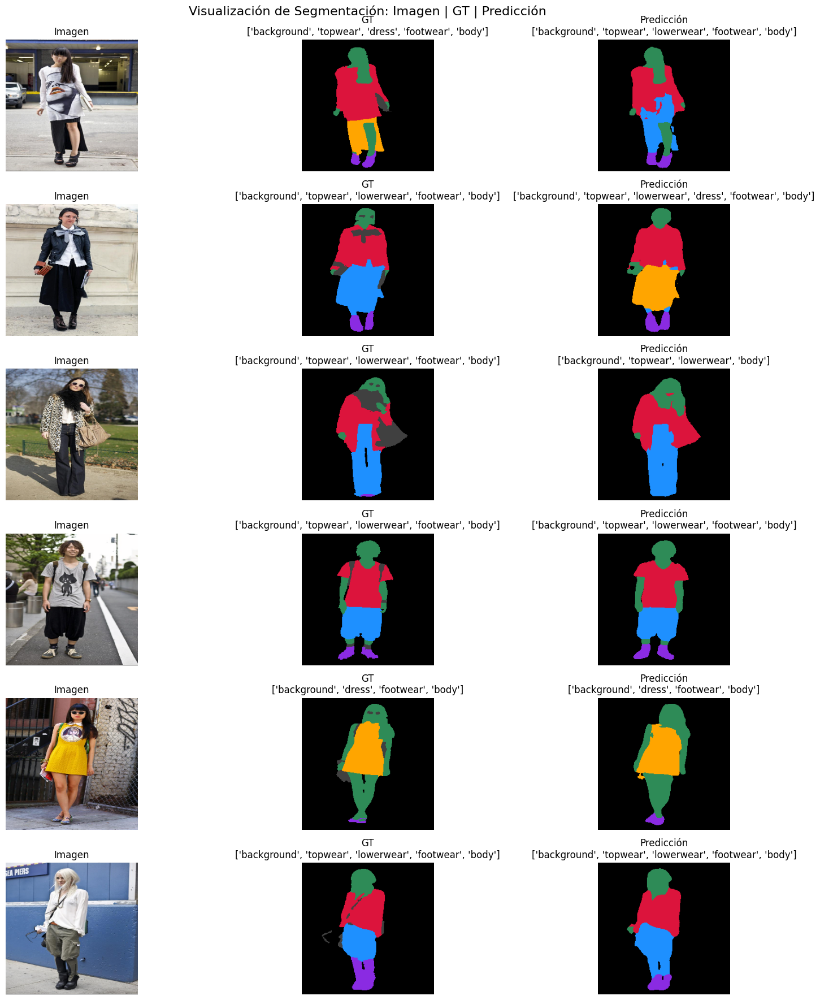

In [200]:
@torch.no_grad()
def predict_mask(model, image, device):
    """
    image: tensor (3,H,W)
    return: tensor (H,W) con clases predichas
    """
    model.eval()
    image = image.unsqueeze(0).to(device)  # (1,3,H,W)
    outputs = model(image)
    pred = torch.argmax(outputs, dim=1)     # (1,H,W)
    return pred.squeeze(0).cpu()


def get_present_classes(mask, n_cls, ignore_index=255):
    """
    Devuelve lista de clases presentes en una máscara
    """
    if torch.is_tensor(mask):
        vals = torch.unique(mask).cpu().numpy()
    else:
        vals = np.unique(mask)

    classes = [int(v) for v in vals if v != ignore_index and v < n_cls]
    return sorted(classes)


def visualize_prediction_sample(
    model,
    dataset,
    n_samples=6,
    device="cpu"
):
    """
    Visualiza:
    Imagen | Máscara GT | Máscara Predicha
    """
    import math
    model.eval()

    # get number of classes / ignore index from dataset if available
    n_cls = dataset.dataset.n_cls if hasattr(dataset, "dataset") else getattr(dataset, "n_cls", n_cls)
    ignore_index = dataset.dataset.ignore_index if hasattr(dataset, "dataset") else getattr(dataset, "ignore_index", 255)


    total_plots = n_samples * 3
    cols = 3
    rows = math.ceil(total_plots / cols)

    fig, axs = plt.subplots(rows, cols, figsize=(18, rows * 3))
    axs = axs.flatten()

    indices = random.sample(range(len(dataset)), n_samples)

    i = 0
    for idx in indices:
        image, gt = dataset[idx]

        # Imagen original
        rgb = to_numpy_image(image.float())

        # GT mask (RGB)
        gt_rgb = mask_to_rgb(
            gt,
            dataset.dataset.n_cls if hasattr(dataset, "dataset") else n_cls,
            dataset.dataset.ignore_index if hasattr(dataset, "dataset") else ignore_index
        )

        # Predicción (mask + RGB)
        pred = predict_mask(model, image, device)
        pred_rgb = mask_to_rgb(
            pred,
            dataset.dataset.n_cls if hasattr(dataset, "dataset") else n_cls,
            dataset.dataset.ignore_index if hasattr(dataset, "dataset") else ignore_index
        )

        # clases presentes en GT y Pred
        gt_classes = get_present_classes(gt, n_cls, ignore_index)
        pred_classes = get_present_classes(pred, n_cls, ignore_index)

        gt_names = [CLASS_NAMES[c] for c in gt_classes]
        pred_names = [CLASS_NAMES[c] for c in pred_classes]

        # mostrar con títulos que incluyen las clases presentes
        plot(axs[i], rgb, "Imagen")
        i += 1
        plot(axs[i], gt_rgb, f"GT\n{gt_names}")
        i += 1
        plot(axs[i], pred_rgb, f"Predicción\n{pred_names}")
        i += 1

        # Títulos con clases
        # gt_title = f"GT\ncls: {gt_classes}"
        # pred_title = f"Predicción\ncls: {pred_classes}"

    for j in range(i, len(axs)):
        axs[j].axis("off")

    plt.suptitle(
        "Visualización de Segmentación: Imagen | GT | Predicción",
        fontsize=16
    )
    plt.tight_layout()
    plt.show()
    
    
    print("=" * 60)
print("VISUALIZANDO PREDICCIONES EN VALIDACIÓN")
print("=" * 60)

visualize_prediction_sample(
    model=model,
    dataset=val_dl.dataset,
    n_samples=6,
    device=device
)



In [201]:


# Si aún no tienes esta función, aquí está mask_to_rgb mejorada
def mask_to_rgb(mask: torch.Tensor, n_cls: int, ignore_index: int = 255) -> np.ndarray:
    """
    Convierte máscara de índices a RGB usando el colormap adecuado
    
    Args:
        mask: tensor (H,W) con índices de clase
        n_cls: número de clases
        ignore_index: valor a ignorar
    
    Returns:
        np.ndarray (H,W,3) en RGB
    """
    # Paleta de colores (ajusta según tu dataset)
    PALETTE = [
        
        [0, 0, 0],        # 0 background → negro
        [220, 20, 60],    # 1 topwear → rojo (crimson)
        [30, 144, 255],   # 2 lowerwear → azul
        [255, 165, 0],    # 3 dress → naranja
        [138, 43, 226],   # 4 footwear → violeta
        [46, 139, 87],    # 5 body → verde (sea green)
    
    ]

    
    # Asegurar que tenemos colores para todas las clases
    if len(PALETTE) < n_cls:
        PALETTE.extend([[0, 0, 0]] * (n_cls - len(PALETTE)))
    
    if torch.is_tensor(mask):
        mask_np = mask.cpu().numpy().astype(np.uint8)
    else:
        mask_np = mask.astype(np.uint8)
    
    # Crear imagen RGB
    h, w = mask_np.shape
    rgb = np.zeros((h, w, 3), dtype=np.uint8)
    
    for class_idx in range(n_cls):
        rgb[mask_np == class_idx] = PALETTE[class_idx]
    
    # Ignorar índice (si existe)
    if ignore_index < 255:  # Solo si no es 255
        rgb[mask_np == ignore_index] = [255, 255, 255]  # Blanco para ignorar
    
    return rgb

def get_class_names(classes: List[int]) -> List[str]:
    """
    Devuelve nombres de clases basados en índices
    
    Args:
        classes: lista de índices de clase
    
    Returns:
        Lista de nombres de clase
    """
    

    
    return [CLASS_NAMES[c] if c < len(CLASS_NAMES) else f"clase_{c}" 
            for c in classes]

def create_legend(classes: List[int], palette: List[List[int]]) -> List[mpatches.Patch]:
    """
    Crea leyenda para las clases presentes
    
    Args:
        classes: lista de índices de clase
        palette: lista de colores RGB
    
    Returns:
        Lista de patches para la leyenda
    """
    class_names = get_class_names(classes)
    patches = []
    
    for class_idx, class_name in zip(classes, class_names):
        color = [c/255 for c in palette[class_idx]]  # Normalizar a [0,1]
        patch = mpatches.Patch(color=color, label=f"{class_idx}: {class_name}")
        patches.append(patch)
    
    return patches

@torch.no_grad()
def predict_from_image(
    model,
    image_path: str,
    transform,
    device: str = "cpu",
    n_cls: int = 8,
    ignore_index: int = 255,
    show_legend: bool = True,
    show_overlay: bool = True,
    overlay_alpha: float = 0.4,
    figsize: Tuple[int, int] = (18, 8)
) -> Tuple[torch.Tensor, List[int], np.ndarray]:
    """
    Prueba el modelo con una imagen cargada desde disco con visualización mejorada
    
    Args:
        model: modelo entrenado
        image_path: ruta a la imagen (jpg/png)
        transform: mismas transforms usadas en el dataset
        device: cpu / cuda
        n_cls: número de clases
        ignore_index: índice ignorado
        show_legend: mostrar leyenda de clases
        show_overlay: mostrar overlay predicción/imagen
        overlay_alpha: transparencia del overlay
        figsize: tamaño de la figura
    
    Returns:
        Tuple: (máscara predicha, clases presentes, imagen original)
    """
    model.eval()
    
    # -------------------------------------------------
    # 1. Cargar imagen
    # -------------------------------------------------
    img_pil = Image.open(image_path).convert("RGB")
    img_np = np.array(img_pil)
    original_size = img_np.shape[:2]  # Guardar tamaño original
    
    # -------------------------------------------------
    # 2. Transformaciones
    # -------------------------------------------------
    transformed = transform(image=img_np)
    img_t = transformed["image"]  # tensor (3,H,W)
    img_t = img_t.unsqueeze(0).to(device)
    
    # -------------------------------------------------
    # 3. Predicción
    # -------------------------------------------------
    outputs = model(img_t)
    pred = torch.argmax(outputs, dim=1).squeeze(0).cpu()
    
    # Redimensionar a tamaño original si es necesario
    if pred.shape != original_size:
        pred_np = pred.numpy().astype(np.uint8)
        pred_resized = cv2.resize(pred_np, (original_size[1], original_size[0]), 
                                  interpolation=cv2.INTER_NEAREST)
        pred = torch.from_numpy(pred_resized)
    
    # -------------------------------------------------
    # 4. Convertir a RGB
    # -------------------------------------------------
    pred_rgb = mask_to_rgb(pred, n_cls, ignore_index)
    
    # -------------------------------------------------
    # 5. Clases presentes
    # -------------------------------------------------
    present_classes = sorted([
        int(v) for v in torch.unique(pred)
        if v != ignore_index and v < n_cls
    ])
    
    present_names = get_class_names(present_classes)
    
    # -------------------------------------------------
    # 6. Preparar visualización
    # -------------------------------------------------
    n_cols = 3 if show_overlay else 2
    fig, axes = plt.subplots(1, n_cols, figsize=figsize)
    
    if n_cols == 2:
        ax_img, ax_pred = axes
    else:
        ax_img, ax_pred, ax_overlay = axes
    
    # Imagen original
    ax_img.imshow(img_np)
    ax_img.set_title("Imagen Original", fontsize=14, fontweight='bold')
    ax_img.axis('off')
        
    # Predicción
    ax_pred.imshow(pred_rgb)
    pred_title = "Predicción"
    if present_classes:
        pred_title += f"\nClases: {present_classes}\n{', '.join(present_names)}"
    ax_pred.set_title(pred_title, fontsize=14, fontweight='bold')
    ax_pred.axis('off')
    
    # Overlay (opcional)
    if show_overlay:
        # Asegurar mismo tamaño
        if pred_rgb.shape[:2] != img_np.shape[:2]:
            pred_rgb = cv2.resize(pred_rgb, (img_np.shape[1], img_np.shape[0]), 
                                  interpolation=cv2.INTER_NEAREST)
        
        overlay = cv2.addWeighted(
            img_np, 1 - overlay_alpha,
            pred_rgb, overlay_alpha,
            0
        )
        
        ax_overlay.imshow(overlay)
        ax_overlay.set_title(f"Overlay (α={overlay_alpha})", 
                           fontsize=14, fontweight='bold')
        ax_overlay.axis('off')
    
    # -------------------------------------------------
    # 7. Leyenda (opcional)
    # -------------------------------------------------
    if show_legend and present_classes:
        # Paleta (debe coincidir con mask_to_rgb)
        PALETTE = CLASS_COLORS
        
        # Crear leyenda como subplot separado o en la figura
        legend_patches = create_legend(present_classes, PALETTE[:n_cls])
        
        # Agregar leyenda en una posición adecuada
        plt.figlegend(
            handles=legend_patches,
            loc='lower center',
            ncol=min(4, len(present_classes)),
            fontsize=10,
            title="Leyenda de Clases",
            title_fontsize=11,
            bbox_to_anchor=(0.5, -0.05)
        )
    
    plt.suptitle(
        f"Segmentación Semántica - {image_path.split('/')[-1]}",
        fontsize=16,
        fontweight='bold',
        y=1.02
    )
    
    plt.tight_layout()
    plt.show()
    
    # -------------------------------------------------
    # 8. Información por consola
    # -------------------------------------------------
    print("=" * 60)
    print("INFORMACIÓN DE PREDICCIÓN")
    print("=" * 60)
    print(f"Archivo: {image_path}")
    print(f"Tamaño original: {original_size}")
    print(f"Tamaño predicha: {pred.shape}")
    print(f"Clases detectadas: {present_classes}")
    print(f"Nombres: {present_names}")
    print(f"Total píxeles: {pred.numel()}")
    
    # Distribución de clases
    if present_classes:
        print("\nDistribución de píxeles por clase:")
        for class_idx in present_classes:
            count = (pred == class_idx).sum().item()
            percentage = (count / pred.numel()) * 100
            class_name = get_class_names([class_idx])[0]
            print(f"  Clase {class_idx} ({class_name}): {count:,} píxeles ({percentage:.2f}%)")
    
    print("=" * 60)
    
    return pred, present_classes, img_np


# # Versión alternativa más compacta si prefieres menos detalles
# @torch.no_grad()
# def predict_from_image_simple(
#     model,
#     image_path: str,
#     transform,
#     device: str = "cpu",
#     n_cls: int = 8,
#     ignore_index: int = 255
# ) -> Tuple[torch.Tensor, List[int]]:
#     """
#     Versión simplificada similar a visualize_prediction_sample
#     """
#     model.eval()
    
#     # Cargar y transformar
#     img_pil = Image.open(image_path).convert("RGB")
#     img_np = np.array(img_pil)
    
#     transformed = transform(image=img_np)
#     img_t = transformed["image"].unsqueeze(0).to(device)
    
#     # Predecir
#     outputs = model(img_t)
#     pred = torch.argmax(outputs, dim=1).squeeze(0).cpu()
    
#     # Clases presentes
#     present_classes = sorted([
#         int(v) for v in torch.unique(pred)
#         if v != ignore_index and v < n_cls
#     ])
    
#     # Visualización estilo dataset
#     pred_rgb = mask_to_rgb(pred, n_cls, ignore_index)
    
#     fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
#     axes[0].imshow(img_np)
#     axes[0].set_title("Imagen", fontsize=12)
#     axes[0].axis('off')
    
#     axes[1].imshow(pred_rgb)
#     title = f"Predicción"
#     if present_classes:
#         names = get_class_names(present_classes)
#         title += f"\nClases: {present_classes}\n{', '.join(names)}"
#     axes[1].set_title(title, fontsize=12)
#     axes[1].axis('off')
    
#     plt.tight_layout()
#     plt.show()
    
#     return pred, present_classes



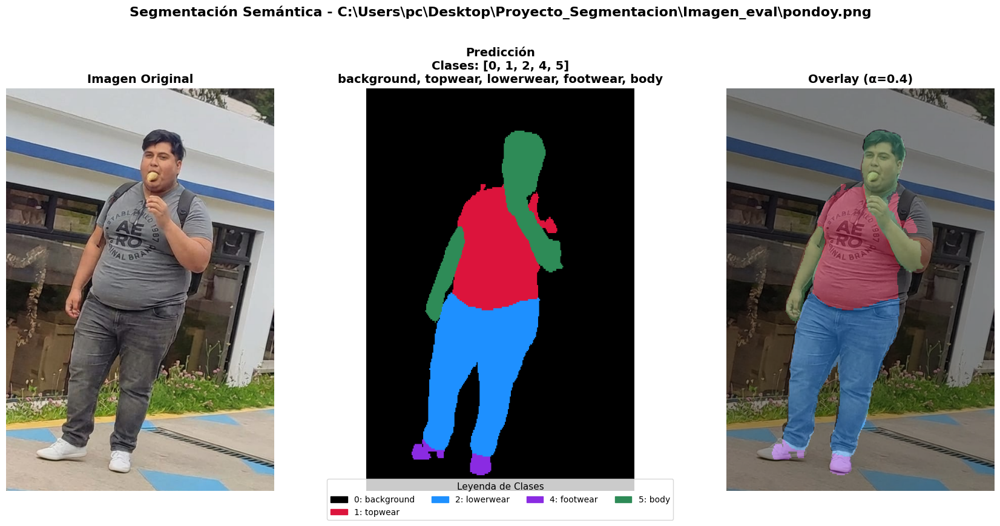

INFORMACIÓN DE PREDICCIÓN
Archivo: C:\Users\pc\Desktop\Proyecto_Segmentacion\Imagen_eval\pondoy.png
Tamaño original: (799, 532)
Tamaño predicha: torch.Size([799, 532])
Clases detectadas: [0, 1, 2, 4, 5]
Nombres: ['background', 'topwear', 'lowerwear', 'footwear', 'body']
Total píxeles: 425068

Distribución de píxeles por clase:
  Clase 0 (background): 324,904 píxeles (76.44%)
  Clase 1 (topwear): 31,348 píxeles (7.37%)
  Clase 2 (lowerwear): 44,379 píxeles (10.44%)
  Clase 4 (footwear): 2,849 píxeles (0.67%)
  Clase 5 (body): 21,588 píxeles (5.08%)


In [234]:
image_path = r"C:\Users\pc\Desktop\Proyecto_Segmentacion\Imagen_eval\pondoy.png"



#image_path = r"C:\Users\pc\Desktop\Proyecto_Segmentacion\Imagen_eval\vialpando.png"

pred_mask, classes, original_img = predict_from_image(
    model=model,
    image_path=image_path,
    transform=val_tf,   # ← IMPORTANTE
    device="cpu",
    n_cls=6,
    ignore_index=255,
    show_legend=True,
    show_overlay=True,
    overlay_alpha=0.4
)

# # Versión simplificada (más parecida al dataset)
# pred_mask, classes = predict_from_image_simple(

#     model=model,
#     image_path=image_path,
#     transform=transform,
#     device=device,
#     n_cls=n_cls
# )

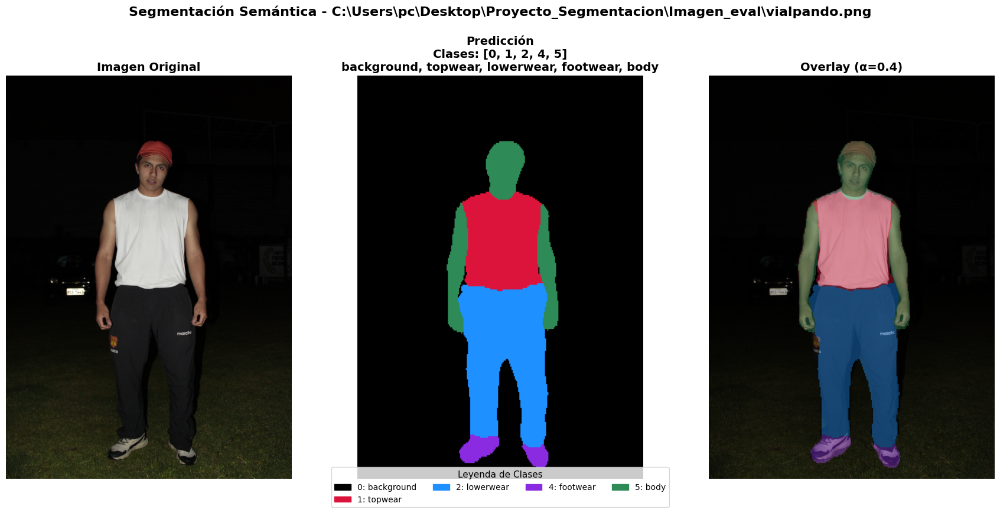

INFORMACIÓN DE PREDICCIÓN
Archivo: C:\Users\pc\Desktop\Proyecto_Segmentacion\Imagen_eval\vialpando.png
Tamaño original: (4480, 3168)
Tamaño predicha: torch.Size([4480, 3168])
Clases detectadas: [0, 1, 2, 4, 5]
Nombres: ['background', 'topwear', 'lowerwear', 'footwear', 'body']
Total píxeles: 14192640

Distribución de píxeles por clase:
  Clase 0 (background): 11,308,681 píxeles (79.68%)
  Clase 1 (topwear): 820,623 píxeles (5.78%)
  Clase 2 (lowerwear): 1,301,940 píxeles (9.17%)
  Clase 4 (footwear): 144,311 píxeles (1.02%)
  Clase 5 (body): 617,085 píxeles (4.35%)


In [235]:
#image_path = r"C:\Users\pc\Desktop\Proyecto_Segmentacion\Imagen_eval\pondoy.png"


image_path = r"C:\Users\pc\Desktop\Proyecto_Segmentacion\Imagen_eval\vialpando.png"

pred_mask, classes, original_img = predict_from_image(
    model=model,
    image_path=image_path,
    transform=val_tf,   # ← IMPORTANTE
    device="cpu",
    n_cls=6,
    ignore_index=255,
    show_legend=True,
    show_overlay=True,
    overlay_alpha=0.4
)

# # Versión simplificada (más parecida al dataset)
# pred_mask, classes = predict_from_image_simple(

#     model=model,
#     image_path=image_path,
#     transform=transform,
#     device=device,
#     n_cls=n_cls
# )

In [ ]:
image_path = r"C:\Users\pc\Desktop\Proyecto_Segmentacion\Imagen_eval\naked.jpeg"

pred_mask, classes, original_img = predict_from_image(
    model=model,
    image_path=image_path,
    transform=val_tf,   # ← IMPORTANTE
    device="cpu",
    n_cls=6,
    ignore_index=255,
    show_legend=True,
    show_overlay=True,
    overlay_alpha=0.4
)


In [203]:

from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


@torch.no_grad()
def compute_confusion_matrix(
    model,
    dataloader,
    n_cls,
    device="cpu",
    ignore_index=255
):
    """
    Calcula la matriz de confusión por píxel para segmentación semántica
    """
    model.eval()

    all_preds = []
    all_gts = []

    for images, gts in dataloader:
        images = images.to(device)
        gts = gts.to(device)

        outputs = model(images)              # (B, C, H, W)
        preds = torch.argmax(outputs, dim=1) # (B, H, W)

        # Aplanar
        preds = preds.view(-1)
        gts   = gts.view(-1)

        # Filtrar ignore_index
        mask = gts != ignore_index
        preds = preds[mask]
        gts   = gts[mask]

        all_preds.append(preds.cpu().numpy())
        all_gts.append(gts.cpu().numpy())

    all_preds = np.concatenate(all_preds)
    all_gts   = np.concatenate(all_gts)

    cm = confusion_matrix(
        all_gts,
        all_preds,
        labels=list(range(n_cls))
    )

    return cm



In [204]:
def plot_confusion_matrix(cm, class_names=None, normalize=True):
    """
    Visualiza la matriz de confusión
    """
    if normalize:
        cm = cm.astype("float") / (cm.sum(axis=1, keepdims=True) + 1e-8)

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt=".2f" if normalize else "d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names
    )

    plt.xlabel("Predicción")
    plt.ylabel("Ground Truth")
    plt.title("Matriz de Confusión (Segmentación)")
    plt.tight_layout()
    plt.show()


CALCULANDO MATRIZ DE CONFUSIÓN (VALIDACIÓN)


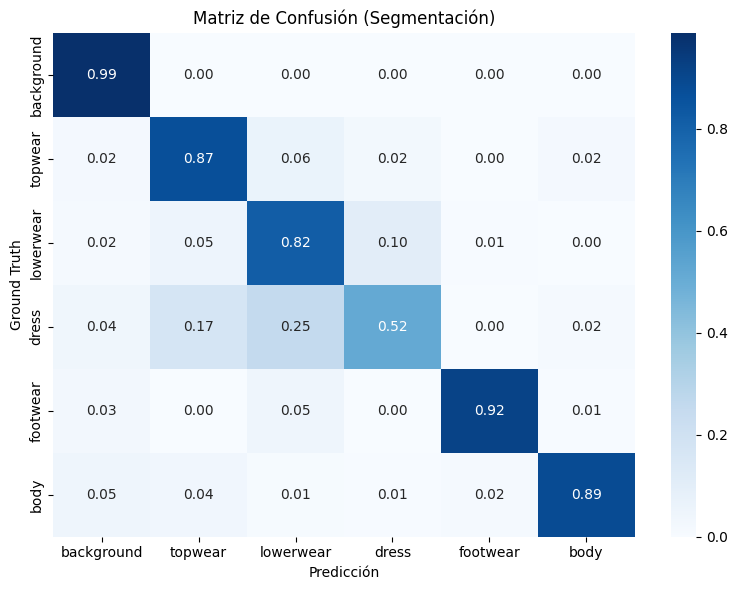

In [237]:
print("="*60)
print("CALCULANDO MATRIZ DE CONFUSIÓN (VALIDACIÓN)")
print("="*60)

cm = compute_confusion_matrix(
    model=model,
    dataloader=val_dl,
    n_cls=n_cls,
    device=device,
    ignore_index=255
)

class_names = CLASS_NAMES.values()

plot_confusion_matrix(cm, class_names=class_names, normalize=True)


In [206]:
def compute_iou_per_class(model, dataloader, n_cls, device="cpu", ignore_index=255):
    model.eval()
    
    intersection = torch.zeros(n_cls)
    union = torch.zeros(n_cls)

    with torch.no_grad():
        for images, gts in dataloader:
            images = images.to(device)
            gts = gts.to(device)

            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            mask = gts != ignore_index

            for cls in range(n_cls):
                pred_c = (preds == cls) & mask
                gt_c   = (gts == cls) & mask

                intersection[cls] += (pred_c & gt_c).sum().cpu()
                union[cls] += (pred_c | gt_c).sum().cpu()

    iou_per_class = {}
    for cls in range(n_cls):
        if union[cls] > 0:
            iou_per_class[f"class_{cls}"] = (intersection[cls] / union[cls]).item()
        else:
            iou_per_class[f"class_{cls}"] = 0.0

    return iou_per_class



In [207]:
iou_per_class = compute_iou_per_class(
    model=model,
    dataloader=val_dl,
    n_cls=n_cls,
    device=device,
    ignore_index=255
)

iou_per_class


{'class_0': 0.9797448515892029,
 'class_1': 0.749193549156189,
 'class_2': 0.6017902493476868,
 'class_3': 0.42478734254837036,
 'class_4': 0.6826684474945068,
 'class_5': 0.7988145351409912}

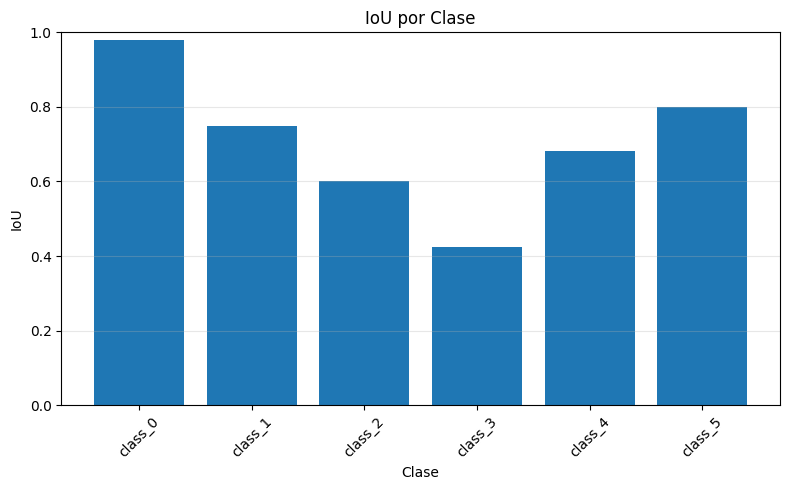

In [208]:
def plot_iou_per_class(iou_dict):
    plt.figure(figsize=(8, 5))
    plt.bar(iou_dict.keys(), iou_dict.values())
    plt.ylabel("IoU")
    plt.xlabel("Clase")
    plt.title("IoU por Clase")
    plt.ylim(0, 1)
    plt.grid(axis="y", alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

plot_iou_per_class(iou_per_class)


In [209]:
from sklearn.metrics import precision_score, recall_score, f1_score

def compute_precision_recall_f1_per_class(
    model,
    dataloader,
    n_cls,
    device="cpu",
    ignore_index=255
):
    model.eval()

    all_preds = []
    all_gts = []

    with torch.no_grad():
        for images, gts in dataloader:
            images = images.to(device)
            gts = gts.to(device)

            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            preds = preds.view(-1)
            gts   = gts.view(-1)

            mask = gts != ignore_index
            all_preds.append(preds[mask].cpu())
            all_gts.append(gts[mask].cpu())

    y_pred = torch.cat(all_preds).numpy()
    y_true = torch.cat(all_gts).numpy()

    precision = precision_score(
        y_true, y_pred,
        labels=list(range(n_cls)),
        average=None,
        zero_division=0
    )
    recall = recall_score(
        y_true, y_pred,
        labels=list(range(n_cls)),
        average=None,
        zero_division=0
    )
    f1 = f1_score(
        y_true, y_pred,
        labels=list(range(n_cls)),
        average=None,
        zero_division=0
    )

    metrics_dict = {
        "precision": {f"class_{i}": precision[i] for i in range(n_cls)},
        "recall":    {f"class_{i}": recall[i] for i in range(n_cls)},
        "f1":        {f"class_{i}": f1[i] for i in range(n_cls)},
    }

    return metrics_dict



In [210]:

metrics_dict = compute_precision_recall_f1_per_class(
    model=model,
    dataloader=val_dl,
    n_cls=n_cls,
    device=device,
    ignore_index=255
)

print(metrics_dict)




{'precision': {'class_0': np.float64(0.9920547748523842), 'class_1': np.float64(0.8438798264754676), 'class_2': np.float64(0.6954297107199435), 'class_3': np.float64(0.7076170681012349), 'class_4': np.float64(0.7288585964419577), 'class_5': np.float64(0.8911843407499725)}, 'recall': {'class_0': np.float64(0.987493335482388), 'class_1': np.float64(0.8697424354030954), 'class_2': np.float64(0.8171612860102935), 'class_3': np.float64(0.5152181460479112), 'class_4': np.float64(0.9150540404930771), 'class_5': np.float64(0.8851494520697565)}, 'f1': {'class_0': np.float64(0.9897687997434291), 'class_1': np.float64(0.856615967000465), 'class_2': np.float64(0.751397090119035), 'class_3': np.float64(0.5962817388975031), 'class_4': np.float64(0.8114117364117364), 'class_5': np.float64(0.8881566449915979)}}


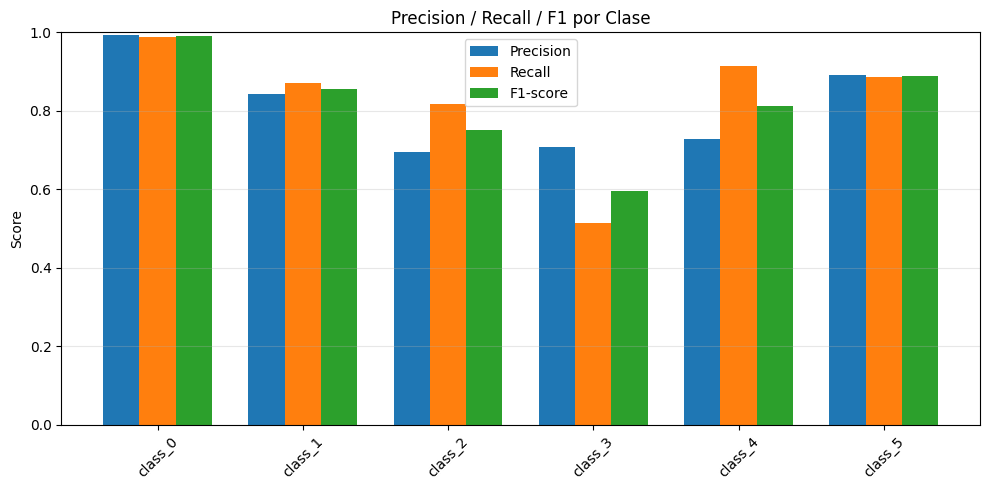

In [211]:
def plot_precision_recall_f1(metrics_dict):
    classes = list(metrics_dict["precision"].keys())

    p = list(metrics_dict["precision"].values())
    r = list(metrics_dict["recall"].values())
    f = list(metrics_dict["f1"].values())

    x = np.arange(len(classes))
    width = 0.25

    plt.figure(figsize=(10, 5))
    plt.bar(x - width, p, width, label="Precision")
    plt.bar(x, r, width, label="Recall")
    plt.bar(x + width, f, width, label="F1-score")

    plt.xticks(x, classes, rotation=45)
    plt.ylim(0, 1)
    plt.ylabel("Score")
    plt.title("Precision / Recall / F1 por Clase")
    plt.legend()
    plt.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    plt.show()
    
plot_precision_recall_f1(metrics_dict)




In [212]:
def visualize_error_map(image, gt, pred):
    """
    image: (H,W,3)
    gt, pred: (H,W)
    """
    error = (gt != pred)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Imagen")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(error, cmap="Reds")
    plt.title("Mapa de Error")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    overlay = image.copy()
    overlay[error] = [255, 0, 0]
    plt.imshow(overlay)
    plt.title("Errores Superpuestos")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


In [213]:
def run_error_map_from_loader(
    model,
    dataloader,
    device="cpu",
    ignore_index=255
):
    model.eval()

    images, gts = next(iter(dataloader))
    images = images.to(device)
    gts = gts.to(device)

    with torch.no_grad():
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

    # TOMAMOS SOLO LA PRIMERA IMAGEN DEL BATCH
    img = images[0].cpu()
    gt  = gts[0].cpu()
    pred = preds[0].cpu()

    # ---- Desnormalizar imagen (ImageNet) ----
    img = img.permute(1, 2, 0).numpy()
    img = (img - img.min()) / (img.max() - img.min())
    img = (img * 255).astype(np.uint8)

    gt = gt.numpy()
    pred = pred.numpy()

    # Ignorar ignore_index en visualización
    mask = gt != ignore_index
    gt = np.where(mask, gt, 0)
    pred = np.where(mask, pred, 0)

    visualize_error_map(img, gt, pred)


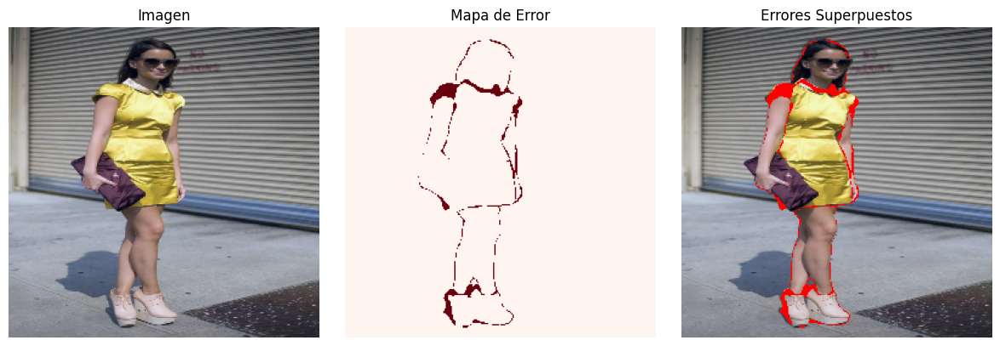

In [214]:
run_error_map_from_loader(
    model=model,
    dataloader=val_dl,
    device=device,
    ignore_index=255
)


# SEPARACION DE PRENDAS Y COLOR

In [215]:
import cv2
import numpy as np

image_path = r"C:\Users\pc\Desktop\Proyecto_Segmentacion\Imagen_eval\vialpando.png"

# Cargar imagen
img_bgr = cv2.imread(image_path)

# Validar
assert img_bgr is not None, "Imagen no encontrada"

# Convertir BGR → RGB
img_np = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

print(img_np.shape, img_np.dtype)


(4480, 3168, 3) uint8


In [216]:
@torch.no_grad()
def predict_mask(model, image_tensor, device):
    model.eval()
    image_tensor = image_tensor.unsqueeze(0).to(device)
    outputs = model(image_tensor)
    pred = torch.argmax(outputs, dim=1)
    return pred.squeeze(0).cpu().numpy()


pred_mask  # (H, W) con clases


tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)

In [217]:

def get_garment_mask(pred_mask, class_id):
    """
    pred_mask: (H,W)
    class_id: int (ej: camiseta)
    return: mask (H,W) uint8 para LaMa
    """
    # 1. Zona NO prenda = 255 (a rellenar)
    mask = np.ones_like(pred_mask, dtype=np.uint8) * 255

    # 2. Zona prenda = 0 (se conserva)
    mask[pred_mask == class_id] = 0

    return mask


In [218]:
def clean_mask(mask):
    kernel = np.ones((7, 7), np.uint8)

    # Eliminar agujeros
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Suavizar bordes
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    return mask


In [219]:
mask = get_garment_mask(pred_mask, class_id=1)  # camiseta
mask = clean_mask(mask)


In [220]:

def show_mask(image, mask):
    plt.figure(figsize=(10,4))

    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("Imagen")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(mask, cmap="gray")
    plt.title("Máscara para LaMa (blanco = rellenar)")
    plt.axis("off")

    plt.show()


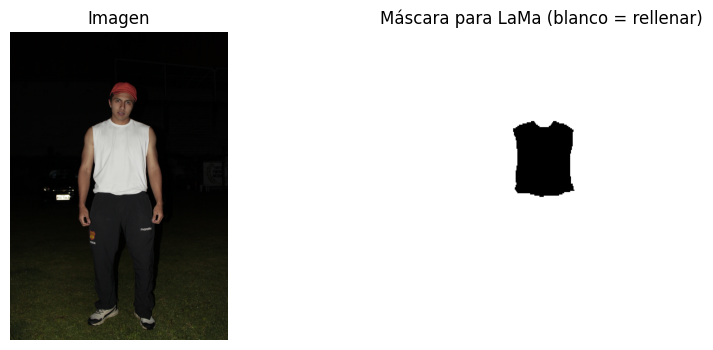

True

In [221]:
show_mask(img_np, mask)

cv2.imwrite("input_image.png", cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR))
cv2.imwrite("input_mask.png", mask)


In [222]:
%pip install opencv-python matplotlib

Note: you may need to restart the kernel to use updated packages.


In [223]:
%pip install numpy cython
%pip install scikit-image

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [224]:
%pip install torch torchvision
%pip install albumentations
%pip install omegaconf
%pip install tqdm

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [225]:
!mkdir -p pretrained

A subdirectory or file -p already exists.
Error occurred while processing: -p.
A subdirectory or file pretrained already exists.
Error occurred while processing: pretrained.


In [226]:
# Imagen inpainted (sin camiseta)
inpainted = cv2.imread(r"C:\Users\pc\Desktop\Proyecto_Segmentacion\input_mask.png")
inpainted = cv2.cvtColor(inpainted, cv2.COLOR_BGR2RGB)


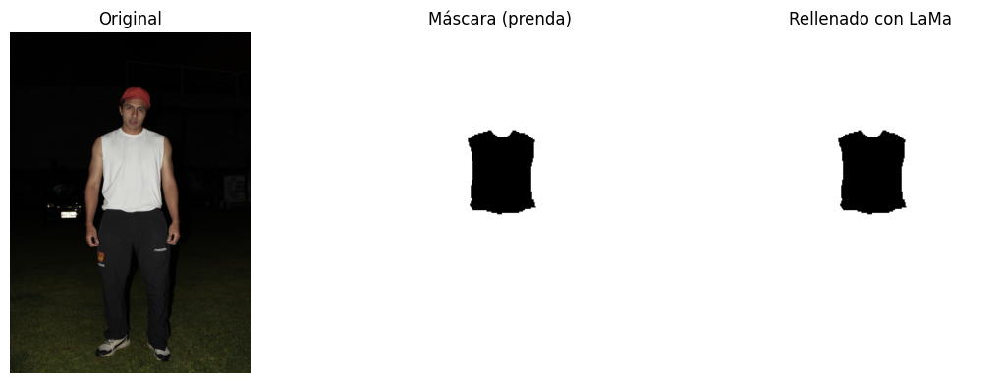

In [227]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(img_np)
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(mask, cmap="gray")
plt.title("Máscara (prenda)")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(inpainted)
plt.title("Rellenado con LaMa")
plt.axis("off")

plt.tight_layout()
plt.show()
